Completed by Igor Malysh, Ekaterina Tyukavkina

# Task 2. Investigating Relationships (part 1)

Analyze the data on Global AI Job Market & Salary Trends 2025.

[Source](https://www.kaggle.com/datasets/bismasajjad/global-ai-job-market-and-salary-trends-2025)

The file `ai_job_dataset.csv` contains the following variables:

| Variable name | Variable description
|:-------------------:|:------------------:|
| job_id | Unique identifier for each job posting |
| job_title | Standardized job title | 
| salary_usd | Annual salary in USD| 
| salary_currency | Original salary currency| 
| salary_local | Salary in local currency| 
| experience_level | EN (Entry), MI (Mid), SE (Senior), EX (Executive)| 
| employment_type |	FT (Full-time), PT (Part-time), CT (Contract), FL (Freelance)| 
| company_location | Country where company is located| 	
| company_size | S (Small <50), M (Medium 50-250), L (Large >250)| 
| employee_residence |	Country where employee resides|
| remote_ratio | 0 (No remote), 50 (Hybrid), 100 (Fully remote)|
| required_skills |	Top 5 required skills (comma-separated)|
| education_required |	Minimum education requirement|
| years_experience | Required years of experience|
| industry | Industry sector of the company |
| posting_date | Date when job was posted |
| application_deadline | Application deadline |
| job_description_length | Character count of job description |
| benefits_score |	Numerical score of benefits package (1-10) |

Please complete the following tasks.

1. For interval or ratio scale variables run suitable normality tests to check whether their distribution is close to the normal distribution. Formulate hypothesis. Create graphs to compare the variables’ distributions with the normal distribution. Make conclusions. 

In [63]:
# your code here

import math
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
import warnings


df = pd.read_csv('ai_job_dataset.csv')

# number of observations and variables, variables’ measurement scale
warnings.filterwarnings('ignore')
df.head()


,job_id,job_title,salary_usd,salary_currency,experience_level,employment_type,company_location,company_size,employee_residence,remote_ratio,required_skills,education_required,years_experience,industry,posting_date,application_deadline,job_description_length,benefits_score,company_name
0,AI00001,AI Research Scientist,90376,USD,SE,CT,China,M,China,50,"Tableau, PyTorch, Kubernetes, Linux, NLP",Bachelor,9,Automotive,2024-10-18,2024-11-07,1076,5.9,Smart Analytics
1,AI00002,AI Software Engineer,61895,USD,EN,CT,Canada,M,Ireland,100,"Deep Learning, AWS, Mathematics, Python, Docker",Master,1,Media,2024-11-20,2025-01-11,1268,5.2,TechCorp Inc
2,AI00003,AI Specialist,152626,USD,MI,FL,Switzerland,L,South Korea,0,"Kubernetes, Deep Learning, Java, Hadoop, NLP",Associate,2,Education,2025-03-18,2025-04-07,1974,9.4,Autonomous Tech
3,AI00004,NLP Engineer,80215,USD,SE,FL,India,M,India,50,"Scala, SQL, Linux, Python",PhD,7,Consulting,2024-12-23,2025-02-24,1345,8.6,Future Systems
4,AI00005,AI Consultant,54624,EUR,EN,PT,France,S,Singapore,100,"MLOps, Java, Tableau, Python",Master,0,Media,2025-04-15,2025-06-23,1989,6.6,Advanced Robotics


In [64]:
df.describe()

,salary_usd,remote_ratio,years_experience,job_description_length,benefits_score
count,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000
mean,115348.965133,49.483333,6.253200,1503.314733,7.504273
std,60260.940438,40.812712,5.545768,576.127083,1.450870
min,32519.000000,0.000000,0.000000,500.000000,5.000000
25%,70179.750000,0.000000,2.000000,1003.750000,6.200000
50%,99705.000000,50.000000,5.000000,1512.000000,7.500000
75%,146408.500000,100.000000,10.000000,2000.000000,8.800000
max,399095.000000,100.000000,19.000000,2499.000000,10.000000


In [65]:
interval_or_ratio_scale_variables = ['salary_usd', 'remote_ratio', 'years_experience', 'job_description_length', 'benefits_score']

df[interval_or_ratio_scale_variables]

,salary_usd,remote_ratio,years_experience,job_description_length,benefits_score
0,90376,50,9,1076,5.9
1,61895,100,1,1268,5.2
2,152626,0,2,1974,9.4
3,80215,50,7,1345,8.6
4,54624,100,0,1989,6.6
...,...,...,...,...,...
14995,38604,50,1,1635,7.9
14996,57811,0,0,1624,8.2
14997,189490,50,17,1336,7.4
14998,79461,0,1,1935,5.6


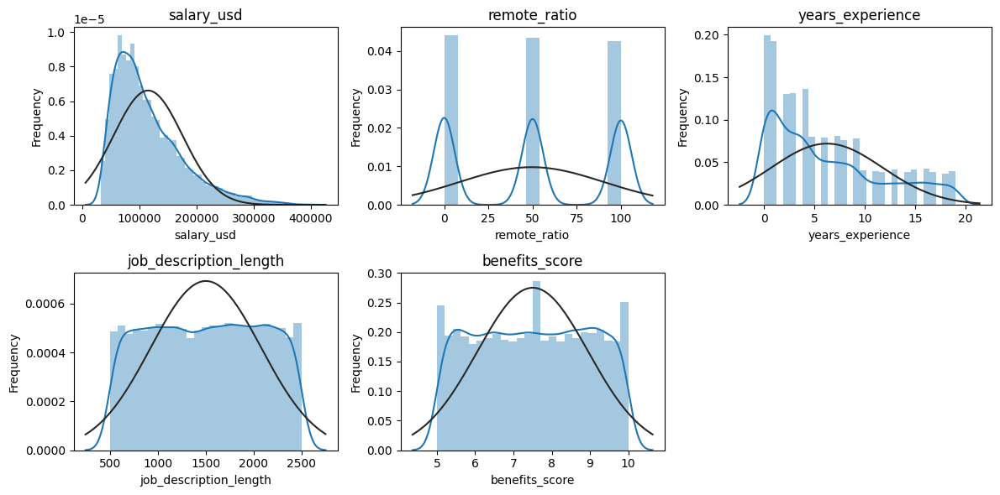

In [66]:
# used llm to plot multiple plots on one chart 

from scipy.stats import norm

vars = interval_or_ratio_scale_variables
n = len(vars)
ncols = 3
nrows = math.ceil(n / ncols)

fig, axes = plt.subplots(nrows, ncols, figsize=(ncols*4, nrows*3))
axes = axes.flatten()

for i, var in enumerate(vars):
    ax = axes[i]
    # ax.hist(df[var].dropna(), bins=20)

    sns.distplot(df[var].dropna(), ax=ax, fit=norm) 

    ax.set_title(var)
    ax.set_ylabel('Frequency')

for ax in axes[n:]:
    ax.set_visible(False)

plt.tight_layout()
plt.show()

In [67]:
for var in interval_or_ratio_scale_variables:
    print(var, stats.shapiro(df[var].dropna()))
    print()

salary_usd ShapiroResult(statistic=np.float64(0.9008752460033119), pvalue=np.float64(1.7227839713232158e-70))

remote_ratio ShapiroResult(statistic=np.float64(0.7932819526307018), pvalue=np.float64(1.0955360919741062e-86))

years_experience ShapiroResult(statistic=np.float64(0.8939501363302923), pvalue=np.float64(6.599084785317721e-72))

job_description_length ShapiroResult(statistic=np.float64(0.9553456395491154), pvalue=np.float64(7.474712240221386e-55))

benefits_score ShapiroResult(statistic=np.float64(0.9535387124797851), pvalue=np.float64(1.390939767787847e-55))



H1: The distribution of var is different from the normal distribution

H0: The distribution of var is not different from the normal distribution

Conclusion: 
as p-value < 0.05 each of variables, H1 is accepted => the distribution is significantly different from normal for every variable

-------

2. Run a chi-square test to analyze the relationship between categorical variables. You can take the existing variables or create new categorical variables based on interval or ratio scale variables. Explain why the chi-square test is applicable to analyze the relationship between the selected pairs of variables. Create a contingency table based on these variables and describe the tendencies that you can observe in frequency distribution. Formulate hypotheses for the chi-square test, interpret the results of analysis and make conclusions. Create a suitable graph to demonstrate the relationship between the selected variables.

In [68]:
# your code here


# lets make a new categorical variable from column "remote_ratio"

mapping = {0: 'No Remote', 50: 'Hybrid', 100: 'Remote'}
df['remote_ratio_category'] = df['remote_ratio'].map(mapping).astype('object')


# categorical_vars = ['experience_level', 'employment_type', 'company_size', 'remote_ratio_category']
categorical_vars = [
    'job_title', 'salary_currency', 'experience_level', 'employment_type',
    'company_location', 'company_size', 'employee_residence', 'remote_ratio',
    'education_required', 'industry', 'company_name']
df_categorical_vars = df[categorical_vars]

df = df.drop('remote_ratio_category', axis=1)

df_categorical_vars


,job_title,salary_currency,experience_level,employment_type,company_location,company_size,employee_residence,remote_ratio,education_required,industry,company_name
0,AI Research Scientist,USD,SE,CT,China,M,China,50,Bachelor,Automotive,Smart Analytics
1,AI Software Engineer,USD,EN,CT,Canada,M,Ireland,100,Master,Media,TechCorp Inc
2,AI Specialist,USD,MI,FL,Switzerland,L,South Korea,0,Associate,Education,Autonomous Tech
3,NLP Engineer,USD,SE,FL,India,M,India,50,PhD,Consulting,Future Systems
4,AI Consultant,EUR,EN,PT,France,S,Singapore,100,Master,Media,Advanced Robotics
...,...,...,...,...,...,...,...,...,...,...,...
14995,Robotics Engineer,USD,EN,FL,Finland,S,Finland,50,Bachelor,Energy,Advanced Robotics
14996,Machine Learning Researcher,GBP,EN,CT,United Kingdom,M,United Kingdom,0,Master,Government,Smart Analytics
14997,NLP Engineer,USD,EX,CT,South Korea,L,South Korea,50,Associate,Manufacturing,AI Innovations
14998,Head of AI,EUR,EN,FT,Netherlands,M,Netherlands,0,PhD,Real Estate,Smart Analytics



Analysis: job_title vs salary_currency
------------------------------------------------------------
Contingency table (counts):
salary_currency              EUR  GBP  USD
job_title                                 
AI Architect                 115   43  613
AI Consultant                113   34  557
AI Product Manager           112   58  573
AI Research Scientist         99   26  631
AI Software Engineer         128   41  615
AI Specialist                102   30  596
Autonomous Systems Engineer  108   33  636
Computer Vision Engineer     123   36  565
Data Analyst                 121   38  600
Data Engineer                129   28  592
Data Scientist               106   34  580
Deep Learning Engineer       102   31  585
Head of AI                   119   37  609
ML Ops Engineer              128   30  567
Machine Learning Engineer    123   32  617
Machine Learning Researcher  117   39  652
NLP Engineer                 115   43  604
Principal Data Scientist     110   44  580
Research Sc

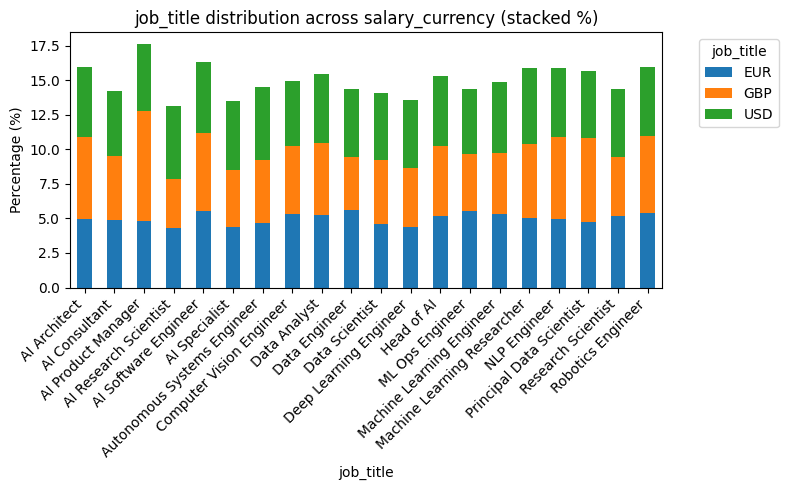

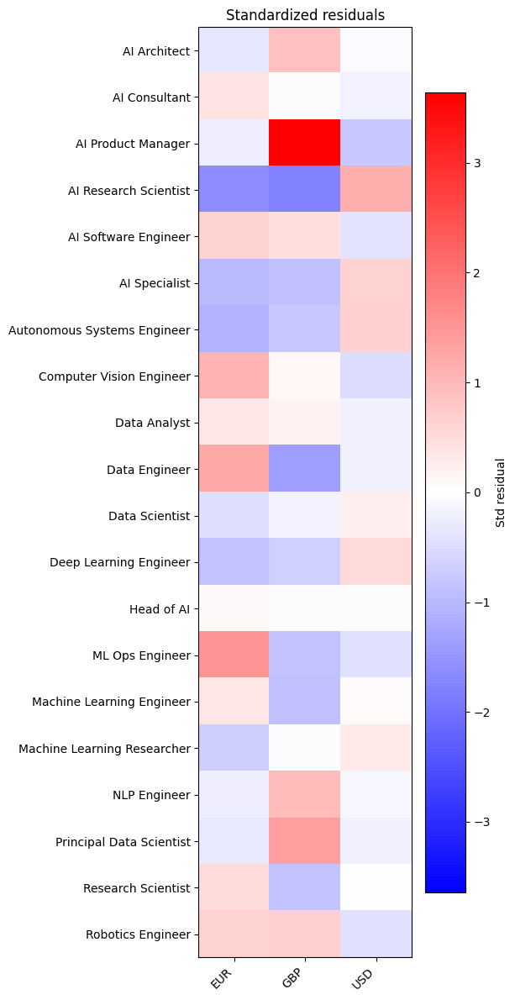


Analysis: job_title vs experience_level
------------------------------------------------------------
Contingency table (counts):
experience_level              EN   EX   MI   SE
job_title                                      
AI Architect                 155  196  213  207
AI Consultant                173  169  186  176
AI Product Manager           194  186  184  179
AI Research Scientist        187  201  186  182
AI Software Engineer         198  206  210  170
AI Specialist                164  195  180  189
Autonomous Systems Engineer  191  177  204  205
Computer Vision Engineer     171  160  209  184
Data Analyst                 200  164  196  199
Data Engineer                177  184  187  201
Data Scientist               174  186  184  176
Deep Learning Engineer       192  175  182  169
Head of AI                   183  203  181  198
ML Ops Engineer              189  189  156  191
Machine Learning Engineer    174  217  174  207
Machine Learning Researcher  228  208  196  176
NLP En

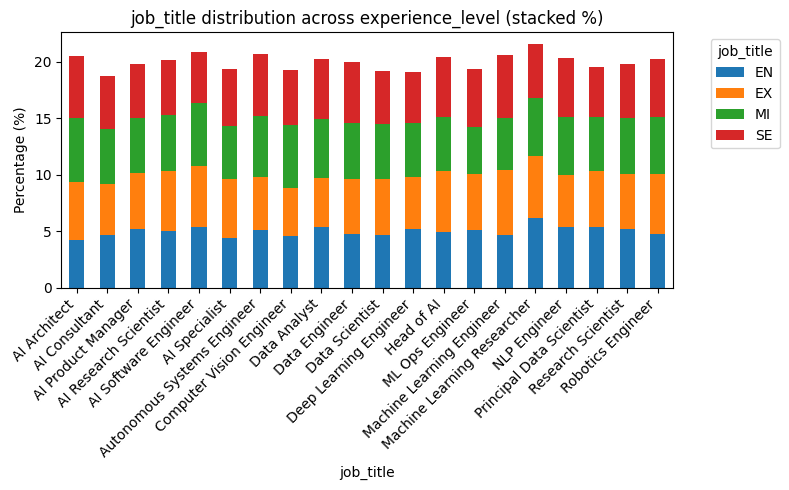

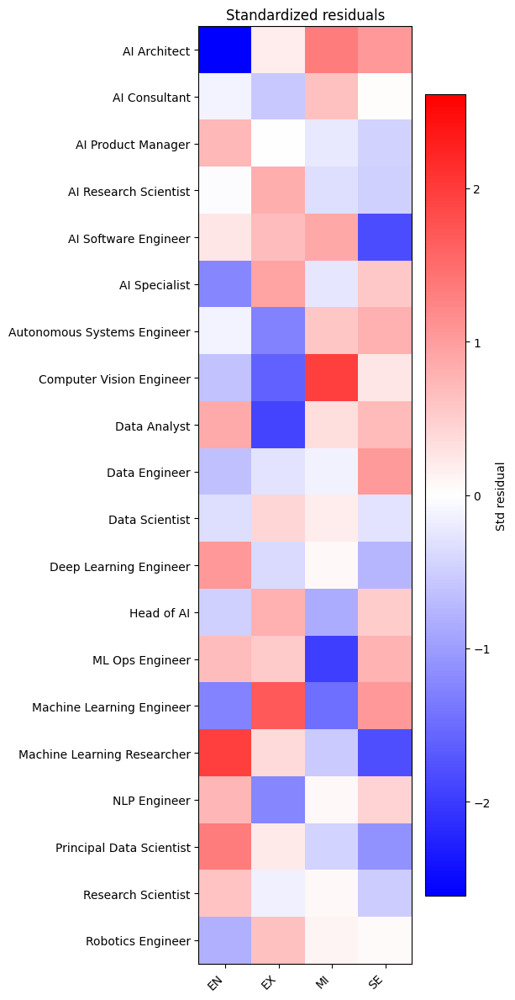


Analysis: job_title vs employment_type
------------------------------------------------------------
Contingency table (counts):
employment_type               CT   FL   FT   PT
job_title                                      
AI Architect                 175  177  222  197
AI Consultant                180  184  167  173
AI Product Manager           182  181  193  187
AI Research Scientist        191  197  189  179
AI Software Engineer         189  206  204  185
AI Specialist                171  197  176  184
Autonomous Systems Engineer  209  184  209  175
Computer Vision Engineer     183  179  183  179
Data Analyst                 190  185  186  198
Data Engineer                181  208  176  184
Data Scientist               173  163  191  193
Deep Learning Engineer       174  185  170  189
Head of AI                   192  196  184  193
ML Ops Engineer              180  214  160  171
Machine Learning Engineer    207  184  211  170
Machine Learning Researcher  195  189  218  206
NLP Eng

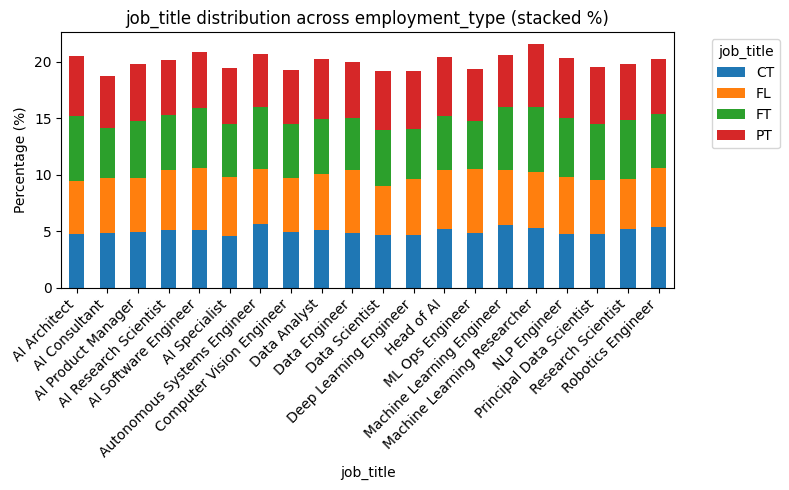

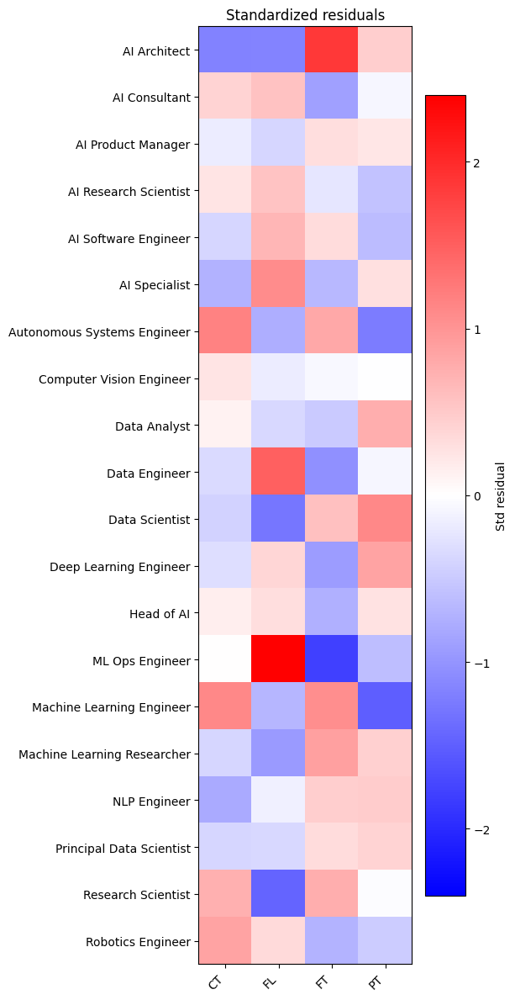


Analysis: job_title vs company_location
------------------------------------------------------------
Contingency table (counts):
company_location             Australia  Austria  Canada  China  Denmark  \
job_title                                                                 
AI Architect                        35       43      41     36       26   
AI Consultant                       36       25      38     35       46   
AI Product Manager                  34       45      43     32       38   
AI Research Scientist               44       40      33     34       57   
AI Software Engineer                33       44      38     48       37   
AI Specialist                       30       39      34     50       39   
Autonomous Systems Engineer         40       28      49     57       35   
Computer Vision Engineer            42       42      37     33       41   
Data Analyst                        36       40      32     33       39   
Data Engineer                       42       

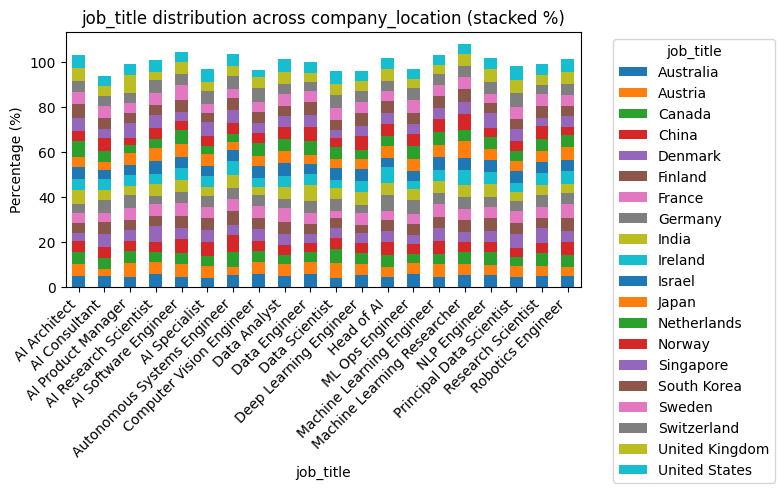

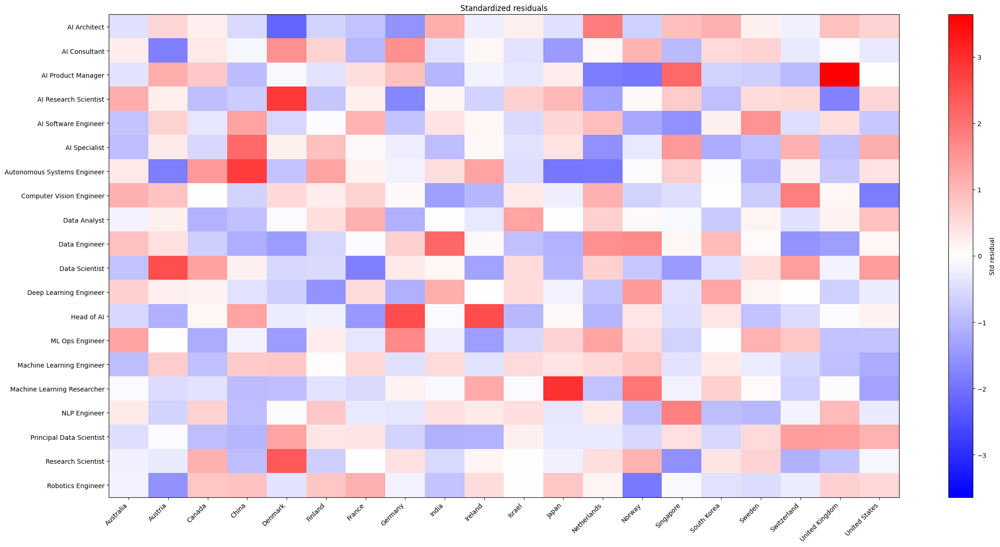


Analysis: job_title vs company_size
------------------------------------------------------------
Contingency table (counts):
company_size                   L    M    S
job_title                                 
AI Architect                 261  249  261
AI Consultant                243  236  225
AI Product Manager           233  256  254
AI Research Scientist        236  256  264
AI Software Engineer         264  249  271
AI Specialist                251  232  245
Autonomous Systems Engineer  249  258  270
Computer Vision Engineer     246  234  244
Data Analyst                 259  265  235
Data Engineer                270  239  240
Data Scientist               250  251  219
Deep Learning Engineer       246  235  237
Head of AI                   246  283  236
ML Ops Engineer              232  251  242
Machine Learning Engineer    267  253  252
Machine Learning Researcher  245  270  293
NLP Engineer                 250  243  269
Principal Data Scientist     257  227  250
Research Scien

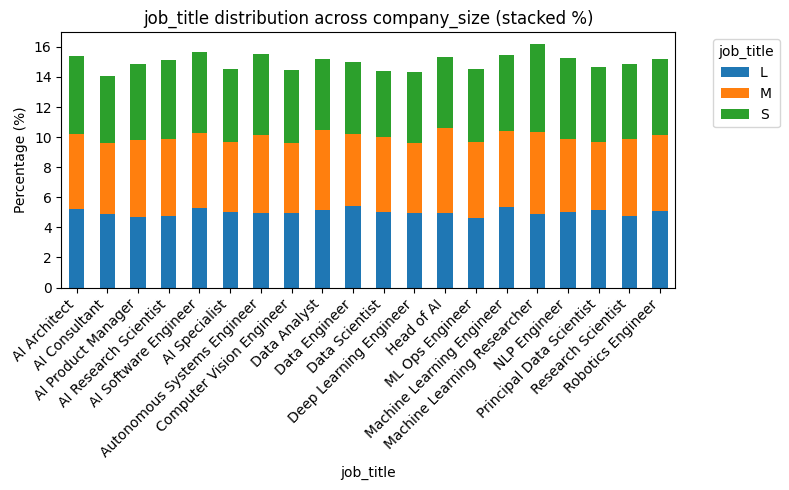

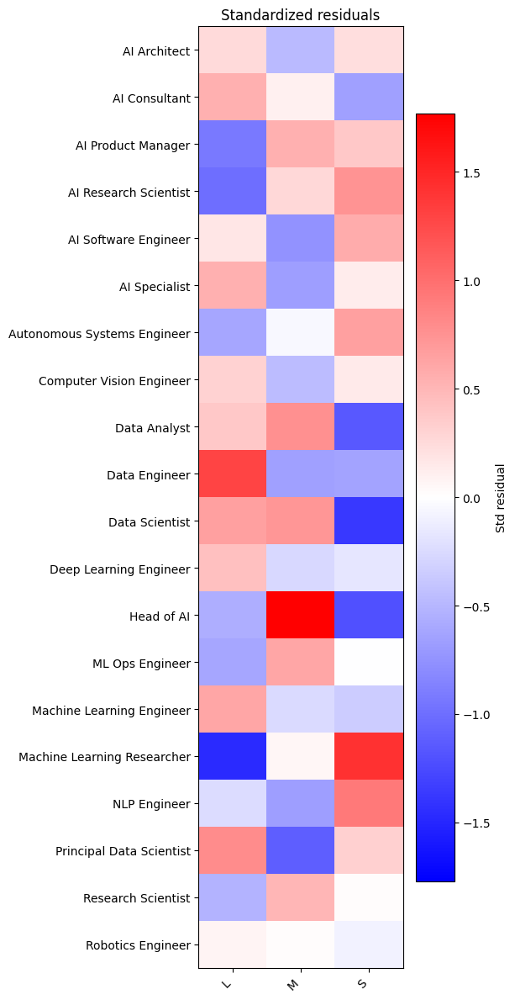


Analysis: job_title vs employee_residence
------------------------------------------------------------
Contingency table (counts):
employee_residence           Australia  Austria  Canada  China  Denmark  \
job_title                                                                 
AI Architect                        46       39      35     26       41   
AI Consultant                       38       33      36     28       46   
AI Product Manager                  31       49      33     40       41   
AI Research Scientist               39       37      31     43       52   
AI Software Engineer                32       46      34     53       42   
AI Specialist                       33       40      39     45       45   
Autonomous Systems Engineer         32       36      43     56       35   
Computer Vision Engineer            42       38      42     41       40   
Data Analyst                        40       46      25     27       35   
Data Engineer                       44     

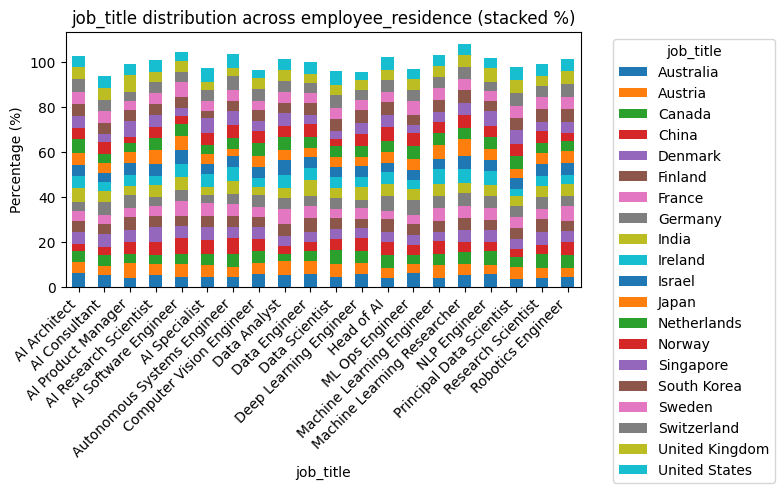

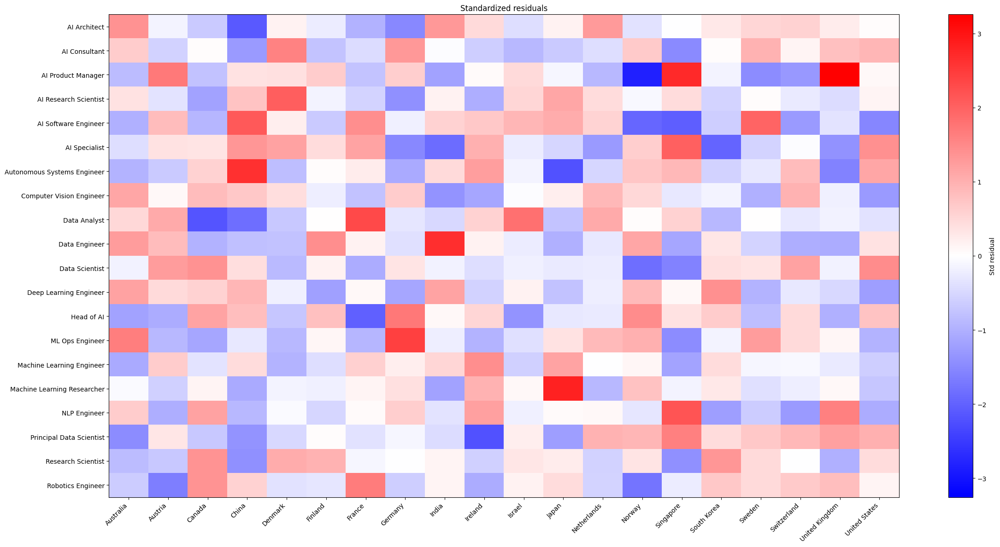


Analysis: job_title vs remote_ratio
------------------------------------------------------------
Contingency table (counts):
remote_ratio                   0  100   50
job_title                                 
AI Architect                 264  255  252
AI Consultant                242  241  221
AI Product Manager           230  243  270
AI Research Scientist        262  235  259
AI Software Engineer         246  264  274
AI Specialist                248  246  234
Autonomous Systems Engineer  241  259  277
Computer Vision Engineer     215  251  258
Data Analyst                 254  249  256
Data Engineer                259  260  230
Data Scientist               240  231  249
Deep Learning Engineer       254  230  234
Head of AI                   277  232  256
ML Ops Engineer              238  247  240
Machine Learning Engineer    257  267  248
Machine Learning Researcher  291  260  257
NLP Engineer                 254  260  248
Principal Data Scientist     255  249  230
Research Scien

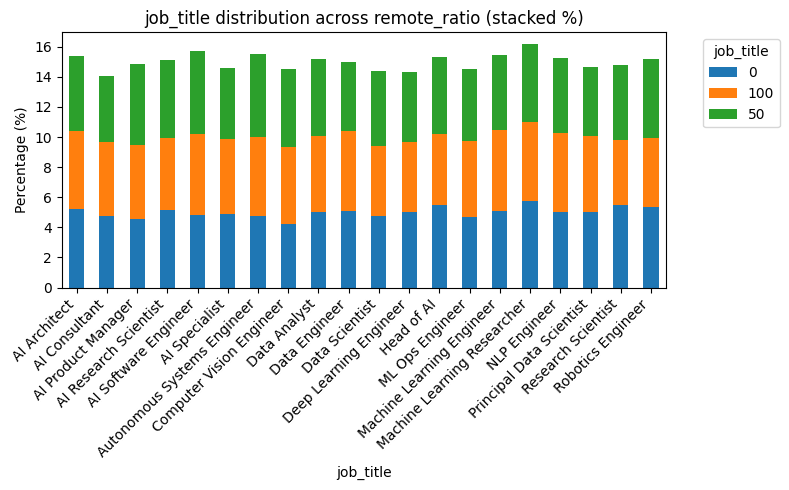

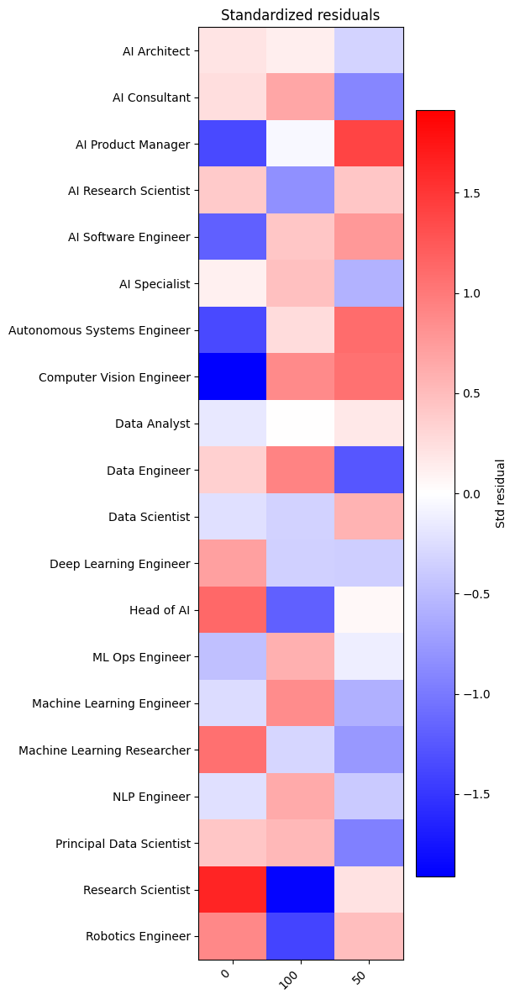


Analysis: job_title vs education_required
------------------------------------------------------------
Contingency table (counts):
education_required           Associate  Bachelor  Master  PhD
job_title                                                    
AI Architect                       209       180     200  182
AI Consultant                      199       166     170  169
AI Product Manager                 181       186     190  186
AI Research Scientist              195       186     199  176
AI Software Engineer               199       209     185  191
AI Specialist                      174       168     193  193
Autonomous Systems Engineer        204       181     185  207
Computer Vision Engineer           167       180     181  196
Data Analyst                       174       208     202  175
Data Engineer                      191       201     178  179
Data Scientist                     175       191     184  170
Deep Learning Engineer             183       195     168  172


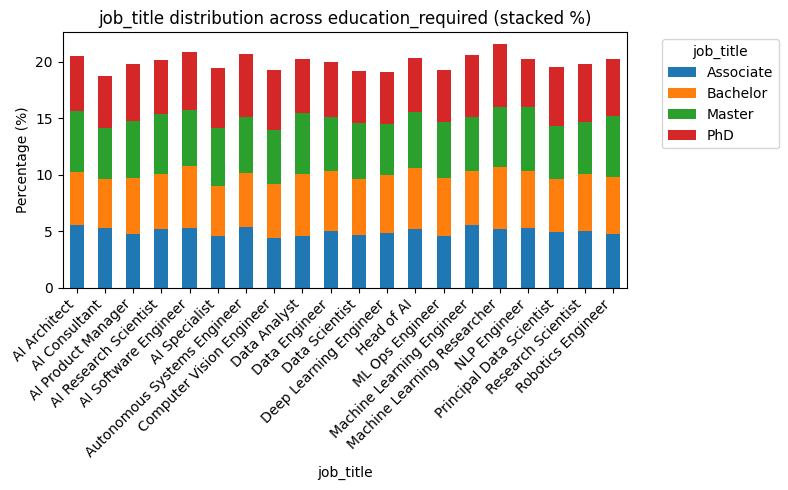

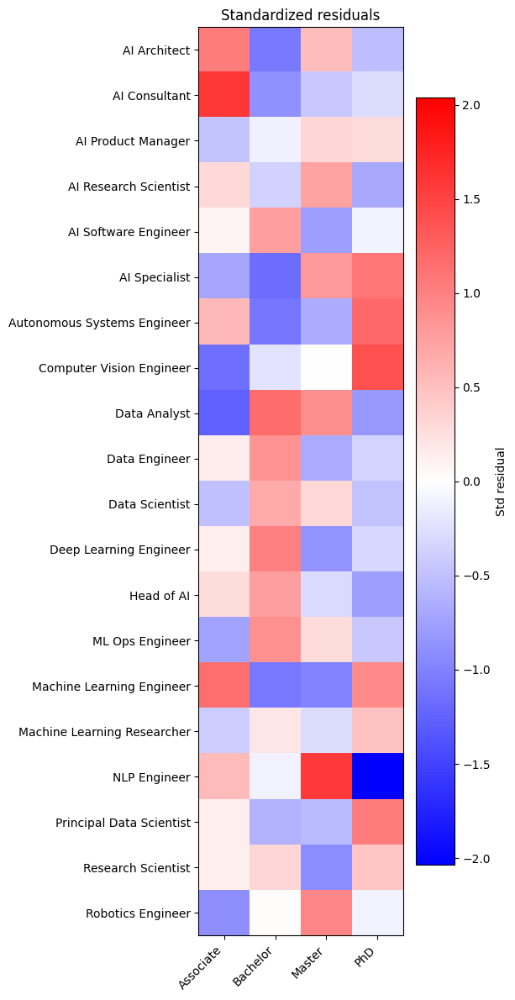


Analysis: job_title vs industry
------------------------------------------------------------
Contingency table (counts):
industry                     Automotive  Consulting  Education  Energy  \
job_title                                                                
AI Architect                         55          65         43      50   
AI Consultant                        53          53         56      52   
AI Product Manager                   53          54         37      57   
AI Research Scientist                46          51         43      54   
AI Software Engineer                 53          65         53      38   
AI Specialist                        55          42         51      45   
Autonomous Systems Engineer          45          58         46      57   
Computer Vision Engineer             48          43         38      49   
Data Analyst                         47          52         47      55   
Data Engineer                        67          49         52  

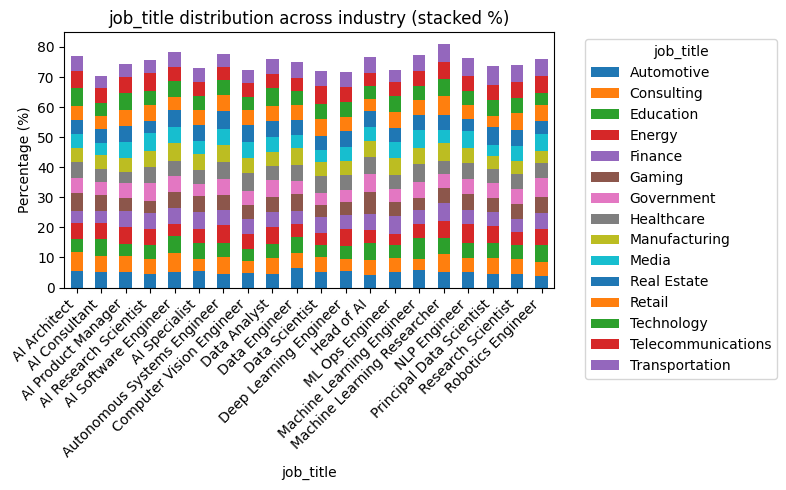

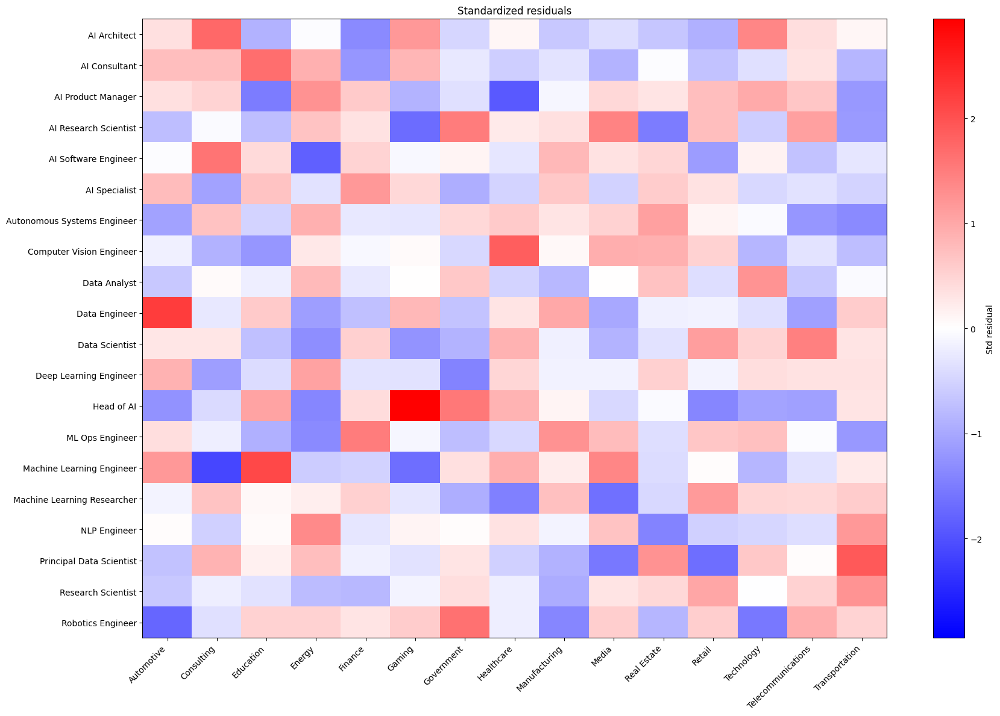


Analysis: job_title vs company_name
------------------------------------------------------------
Contingency table (counts):
company_name                 AI Innovations  Advanced Robotics  \
job_title                                                        
AI Architect                             52                 57   
AI Consultant                            40                 45   
AI Product Manager                       42                 51   
AI Research Scientist                    53                 45   
AI Software Engineer                     58                 50   
AI Specialist                            45                 41   
Autonomous Systems Engineer              42                 58   
Computer Vision Engineer                 48                 40   
Data Analyst                             43                 44   
Data Engineer                            51                 27   
Data Scientist                           48                 37   
Deep Learning En

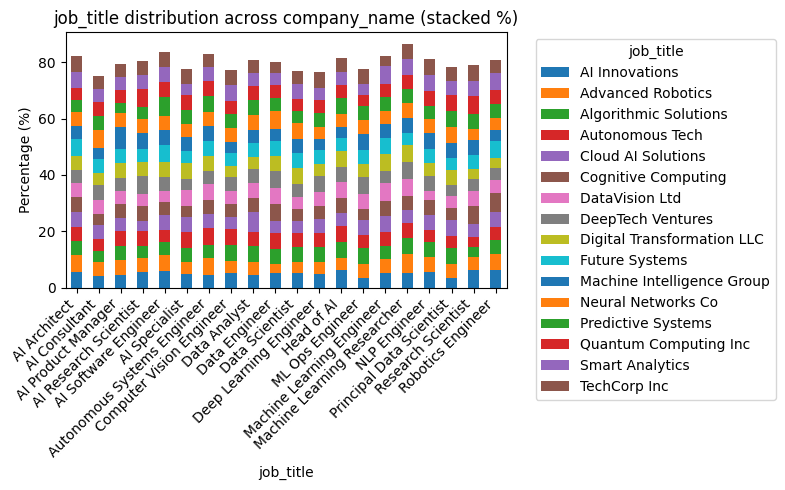

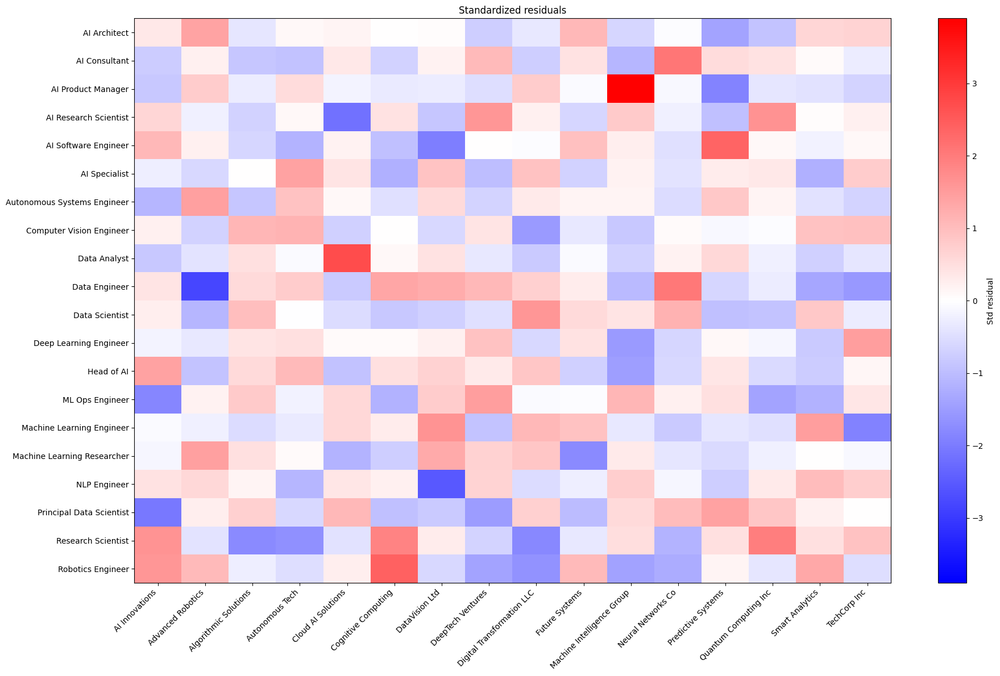


Analysis: salary_currency vs experience_level
------------------------------------------------------------
Contingency table (counts):
experience_level    EN    EX    MI    SE
salary_currency                         
EUR                558   583   616   557
GBP                182   177   178   192
USD               2978  3000  2987  2992

Chi2 = 4.259488
Degrees of freedom = 6
p-value = 0.641606 
n = 15000, table shape = 3 x 4

Expected frequencies:
experience_level       EN       EX       MI       SE
salary_currency                                     
EUR                573.56   580.04   583.28   577.11
GBP                180.69   182.74   183.76   181.81
USD               2963.74  2997.22  3013.96  2982.08

Standardized residuals (obs - exp) / sqrt(exp):
experience_level     EN     EX     MI     SE
salary_currency                             
EUR              -0.650  0.123  1.355 -0.837
GBP               0.097 -0.424 -0.425  0.756
USD               0.262  0.051 -0.491  0.182

Distr

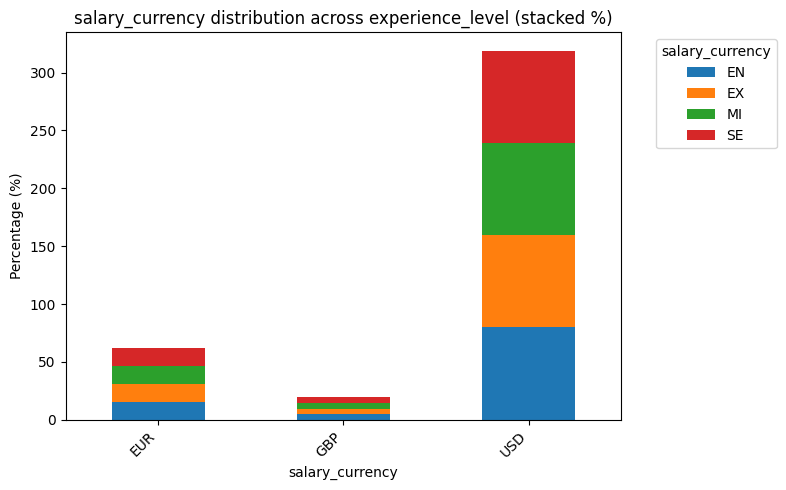

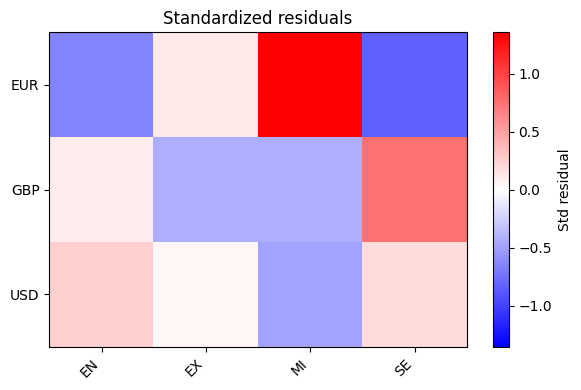


Analysis: salary_currency vs employment_type
------------------------------------------------------------
Contingency table (counts):
employment_type    CT    FL    FT    PT
salary_currency                        
EUR               611   579   568   556
GBP               181   175   193   180
USD              2929  3004  3051  2973

Chi2 = 4.797020
Degrees of freedom = 6
p-value = 0.570098 
n = 15000, table shape = 3 x 4

Expected frequencies:
employment_type       CT       FL       FT       PT
salary_currency                                    
EUR               574.03   579.73   588.06   572.18
GBP               180.84   182.64   185.26   180.26
USD              2966.13  2995.63  3038.67  2956.57

Standardized residuals (obs - exp) / sqrt(exp):
employment_type     CT     FL     FT     PT
salary_currency                            
EUR              1.543 -0.030 -0.827 -0.676
GBP              0.012 -0.565  0.568 -0.019
USD             -0.682  0.153  0.224  0.302

Distribution of salar

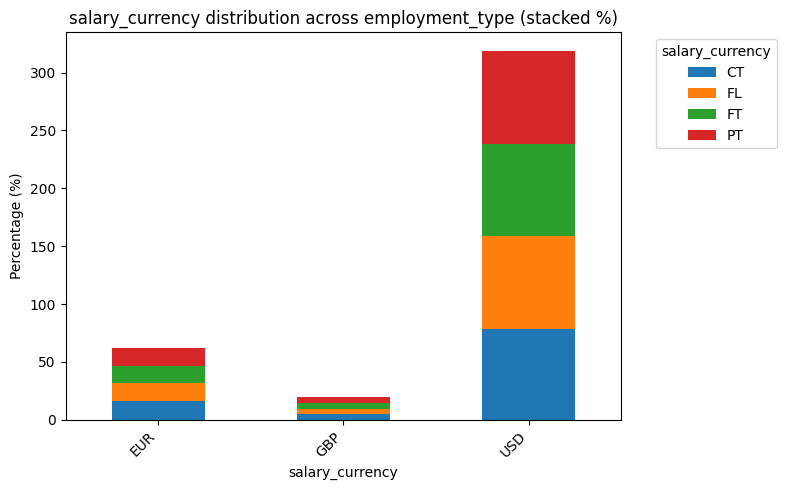

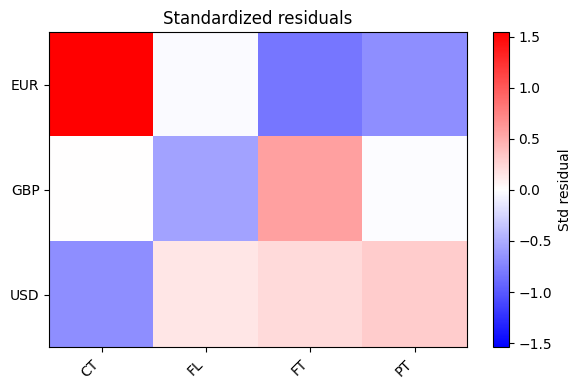


Analysis: salary_currency vs company_location
------------------------------------------------------------
Contingency table (counts):
company_location  Australia  Austria  Canada  China  Denmark  Finland  France  \
salary_currency                                                                 
EUR                       0        0       0      0        0        0     769   
GBP                       0        0       0      0        0        0       0   
USD                     732      765     769    763      778      733       0   

company_location  Germany  India  Ireland  Israel  Japan  Netherlands  Norway  \
salary_currency                                                                 
EUR                   814      0        0       0      0          731       0   
GBP                     0      0        0       0      0            0       0   
USD                     0    754      750     751    733            0     721   

company_location  Singapore  South Korea  Sweden  Sw

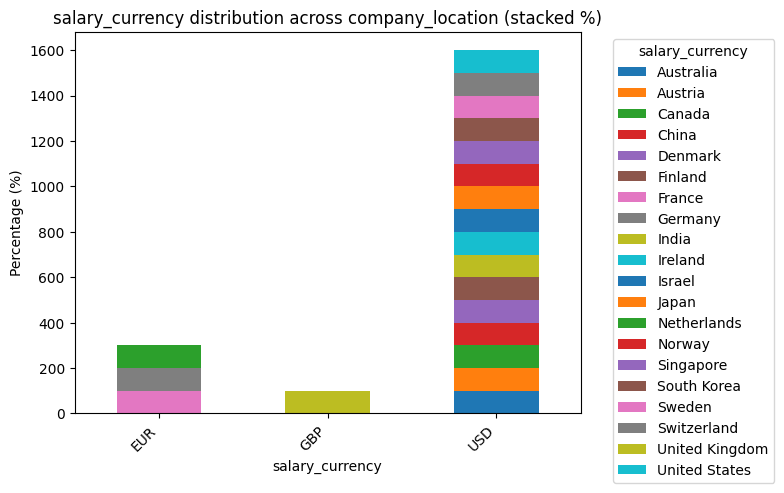

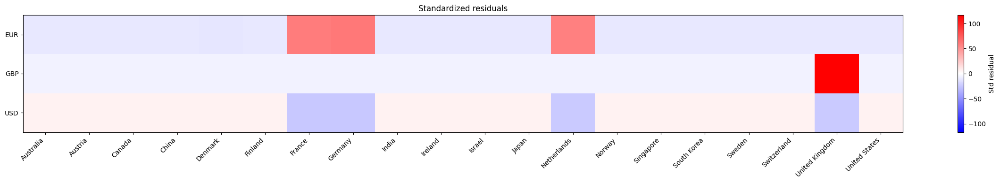


Analysis: salary_currency vs company_size
------------------------------------------------------------
Contingency table (counts):
company_size        L     M     S
salary_currency                  
EUR               763   754   797
GBP               222   255   252
USD              4013  3986  3958

Chi2 = 4.438189
Degrees of freedom = 4
p-value = 0.349940 
n = 15000, table shape = 3 x 3

Expected frequencies:
company_size           L        M        S
salary_currency                           
EUR               771.02   770.56   772.41
GBP               242.90   242.76   243.34
USD              3984.07  3981.68  3991.25

Standardized residuals (obs - exp) / sqrt(exp):
company_size         L      M      S
salary_currency                     
EUR             -0.289 -0.597  0.885
GBP             -1.341  0.786  0.555
USD              0.458  0.068 -0.526

Distribution of salary_currency within each company_size (%) :
company_size         L      M      S
salary_currency                   

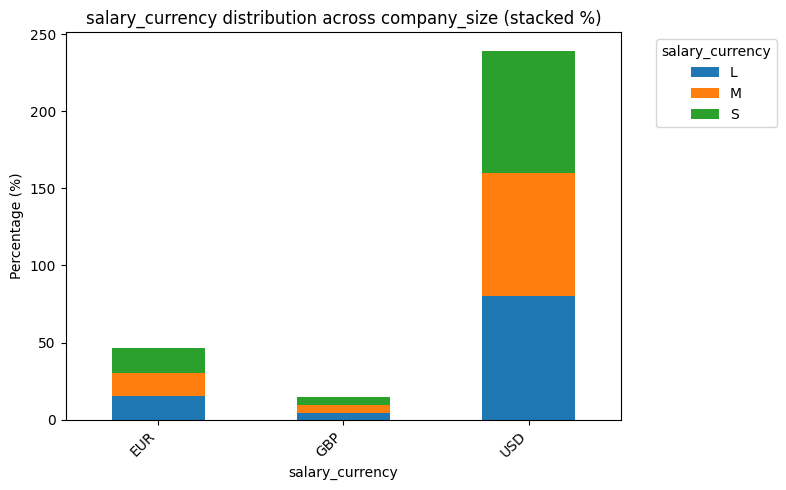

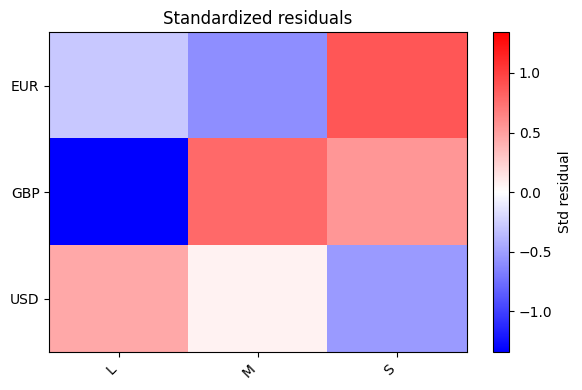


Analysis: salary_currency vs employee_residence
------------------------------------------------------------
Contingency table (counts):
employee_residence  Australia  Austria  Canada  China  Denmark  Finland  \
salary_currency                                                           
EUR                        28       47      41     34       39       33   
GBP                        13        8      11     10       17        5   
USD                       689      721     710    717      721      672   

employee_residence  France  Germany  India  Ireland  Israel  Japan  \
salary_currency                                                      
EUR                    583      595     35       33      27     32   
GBP                     17       11      8       11      11     13   
USD                    181      163    729      696     693    655   

employee_residence  Netherlands  Norway  Singapore  South Korea  Sweden  \
salary_currency                                             

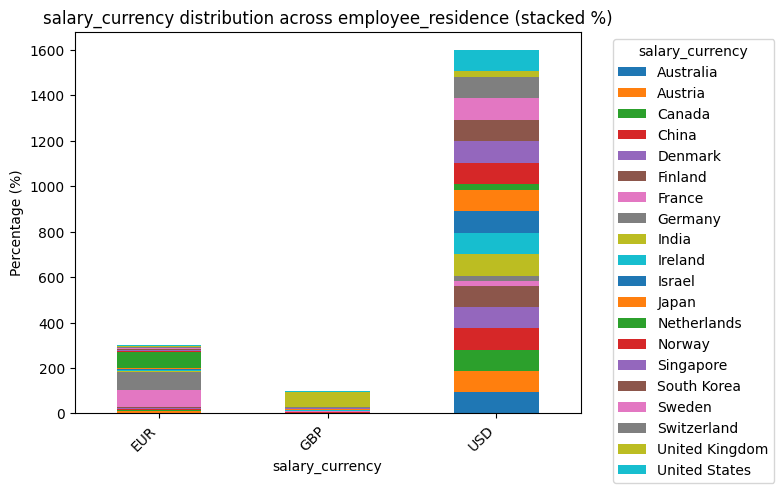

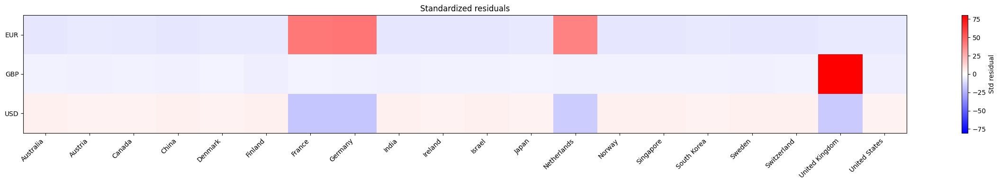


Analysis: salary_currency vs remote_ratio
------------------------------------------------------------
Contingency table (counts):
remote_ratio        0   100    50
salary_currency                  
EUR               794   731   789
GBP               260   214   255
USD              4021  3975  3961

Chi2 = 6.560665
Degrees of freedom = 4
p-value = 0.161008 
n = 15000, table shape = 3 x 3

Expected frequencies:
remote_ratio           0      100       50
salary_currency                           
EUR               782.90   758.99   772.10
GBP               246.64   239.11   243.24
USD              4045.45  3921.90  3989.65

Standardized residuals (obs - exp) / sqrt(exp):
remote_ratio         0    100     50
salary_currency                     
EUR              0.397 -1.016  0.608
GBP              0.850 -1.624  0.754
USD             -0.384  0.848 -0.454

Distribution of salary_currency within each remote_ratio (%) :
remote_ratio         0    100     50
salary_currency                   

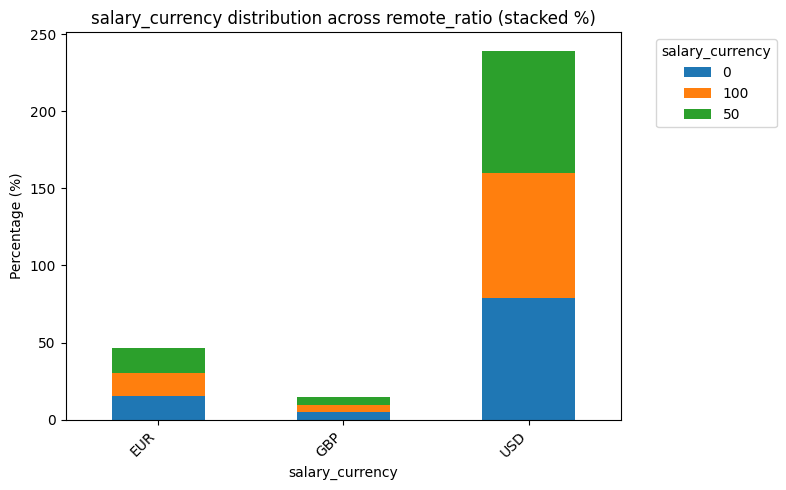

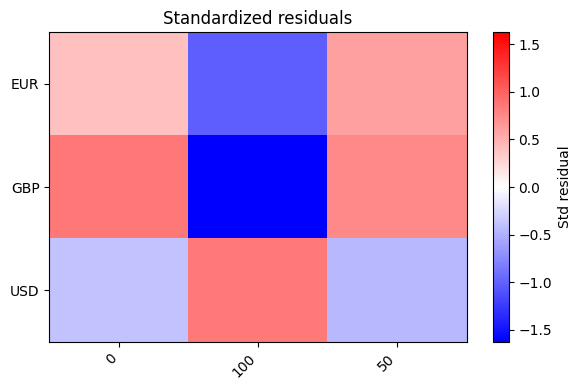


Analysis: salary_currency vs education_required
------------------------------------------------------------
Contingency table (counts):
education_required  Associate  Bachelor  Master   PhD
salary_currency                                      
EUR                       599       586     552   577
GBP                       195       158     188   188
USD                      2991      3045    3008  2913

Chi2 = 7.473358
Degrees of freedom = 6
p-value = 0.279278 
n = 15000, table shape = 3 x 4

Expected frequencies:
education_required  Associate  Bachelor   Master      PhD
salary_currency                                          
EUR                    583.90    584.52   578.19   567.39
GBP                    183.95    184.15   182.15   178.75
USD                   3017.15   3020.34  2987.66  2931.86

Standardized residuals (obs - exp) / sqrt(exp):
education_required  Associate  Bachelor  Master    PhD
salary_currency                                       
EUR                     0.625

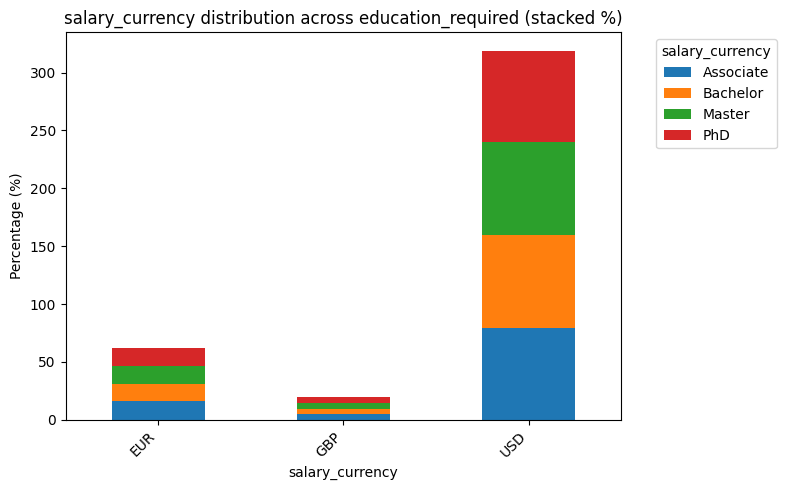

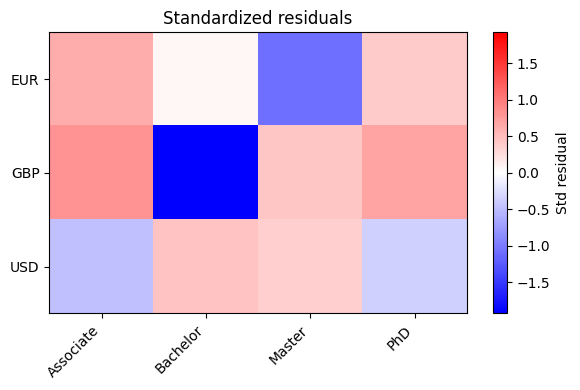


Analysis: salary_currency vs industry
------------------------------------------------------------
Contingency table (counts):
industry         Automotive  Consulting  Education  Energy  Finance  Gaming  \
salary_currency                                                               
EUR                     173         156        144     119      168     146   
GBP                      45          50         50      45       46      49   
USD                     802         814        762     812      770     772   

industry         Government  Healthcare  Manufacturing  Media  Real Estate  \
salary_currency                                                              
EUR                     155         136            158    179          172   
GBP                      63          46             41     47           48   
USD                     780         815            763    819          787   

industry         Retail  Technology  Telecommunications  Transportation  
salary_curr

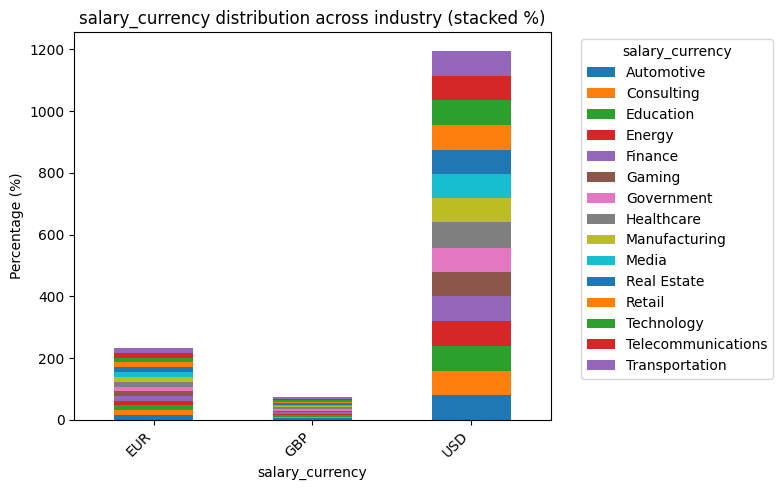

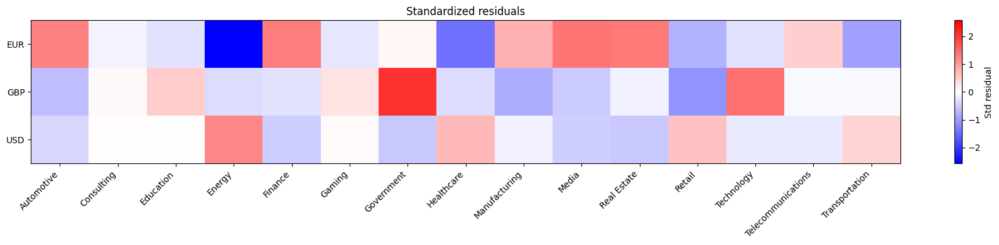


Analysis: salary_currency vs company_name
------------------------------------------------------------
Contingency table (counts):
company_name     AI Innovations  Advanced Robotics  Algorithmic Solutions  \
salary_currency                                                             
EUR                         149                143                    138   
GBP                          56                 46                     41   
USD                         759                736                    706   

company_name     Autonomous Tech  Cloud AI Solutions  Cognitive Computing  \
salary_currency                                                             
EUR                          158                 121                  152   
GBP                           44                  37                   46   
USD                          716                 793                  774   

company_name     DataVision Ltd  DeepTech Ventures  \
salary_currency                           

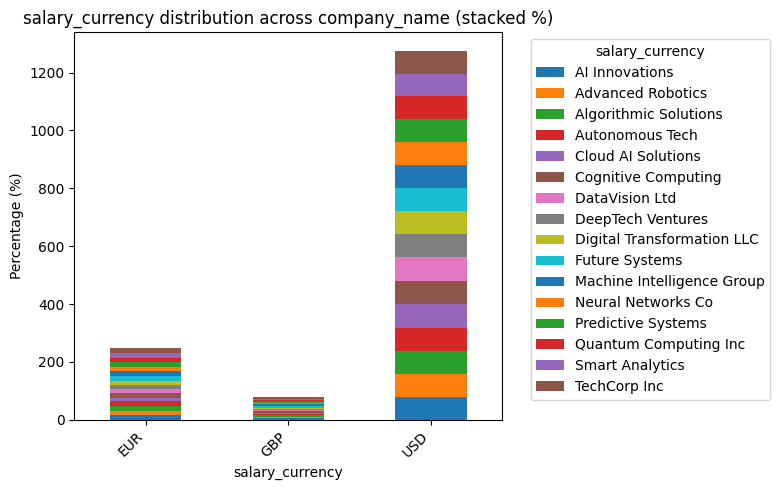

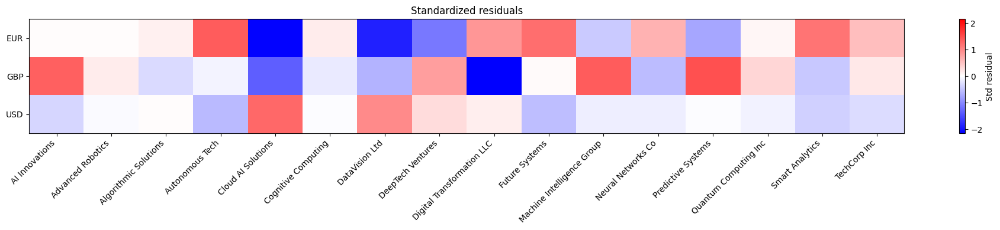


Analysis: experience_level vs employment_type
------------------------------------------------------------
Contingency table (counts):
employment_type    CT    FL   FT   PT
experience_level                     
EN                912   900  939  967
EX                953   920  963  924
MI                937  1000  924  920
SE                919   938  986  898

Chi2 = 11.512198
Degrees of freedom = 9
p-value = 0.242226 
n = 15000, table shape = 4 x 4

Expected frequencies:
employment_type       CT      FL      FT      PT
experience_level                                
EN                922.31  931.48  944.87  919.34
EX                932.73  942.01  955.54  929.72
MI                937.94  947.27  960.88  934.92
SE                928.02  937.25  950.71  925.02

Standardized residuals (obs - exp) / sqrt(exp):
employment_type      CT     FL     FT     PT
experience_level                            
EN               -0.340 -1.032 -0.191  1.572
EX                0.664 -0.717  0.241 -0.18

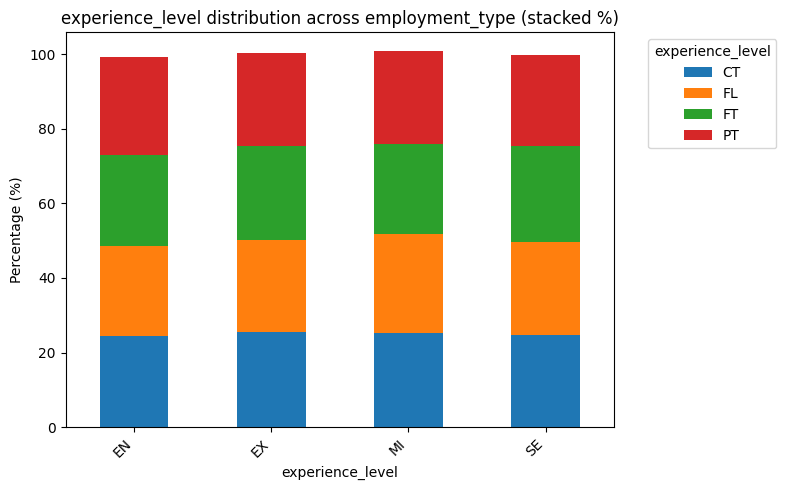

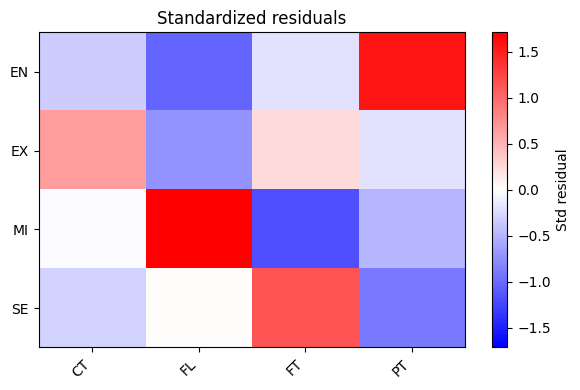


Analysis: experience_level vs company_location
------------------------------------------------------------
Contingency table (counts):
company_location  Australia  Austria  Canada  China  Denmark  Finland  France  \
experience_level                                                                
EN                      204      184     186    198      164      162     188   
EX                      180      183     192    176      231      198     190   
MI                      177      205     190    187      202      184     198   
SE                      171      193     201    202      181      189     193   

company_location  Germany  India  Ireland  Israel  Japan  Netherlands  Norway  \
experience_level                                                                
EN                    186    189      195     193    185          184     181   
EX                    212    170      184     196    188          181     189   
MI                    224    199      192     175   

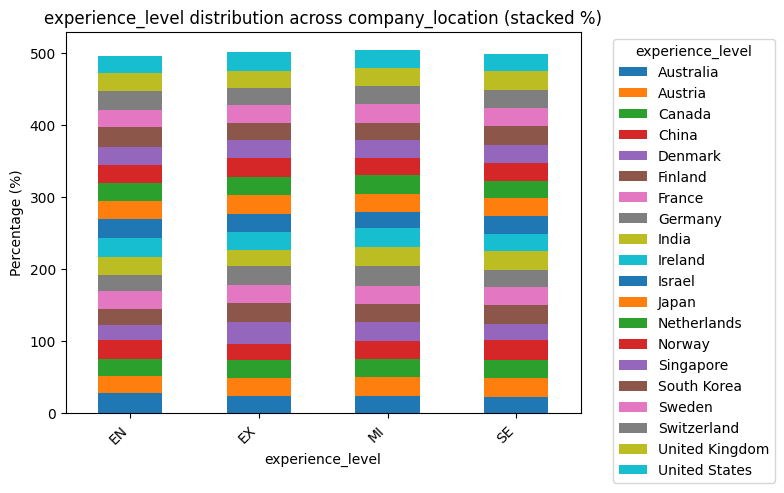

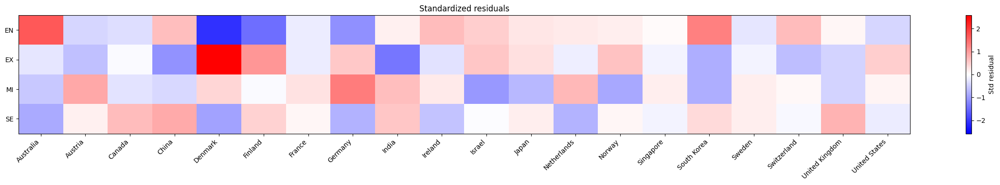


Analysis: experience_level vs company_size
------------------------------------------------------------
Contingency table (counts):
company_size         L     M     S
experience_level                  
EN                1214  1237  1267
EX                1201  1263  1296
MI                1284  1277  1220
SE                1299  1218  1224

Chi2 = 10.056921
Degrees of freedom = 6
p-value = 0.122275 
n = 15000, table shape = 4 x 3

Expected frequencies:
company_size            L        M        S
experience_level                           
EN                1238.84  1238.09  1241.07
EX                1252.83  1252.08  1255.09
MI                1259.83  1259.07  1262.10
SE                1246.50  1245.75  1248.75

Standardized residuals (obs - exp) / sqrt(exp):
company_size          L      M      S
experience_level                     
EN               -0.706 -0.031  0.736
EX               -1.464  0.309  1.155
MI                0.681  0.505 -1.185
SE                1.487 -0.786 -0.700



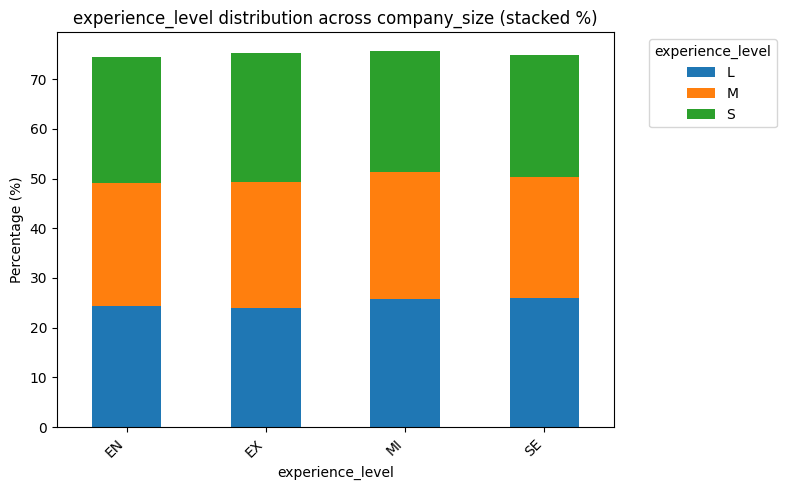

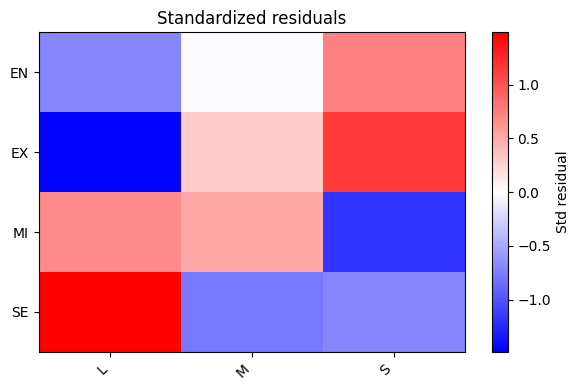


Analysis: experience_level vs employee_residence
------------------------------------------------------------
Contingency table (counts):
employee_residence  Australia  Austria  Canada  China  Denmark  Finland  \
experience_level                                                          
EN                        200      183     175    206      173      159   
EX                        187      201     204    177      213      182   
MI                        175      198     179    198      205      188   
SE                        168      194     204    180      186      181   

employee_residence  France  Germany  India  Ireland  Israel  Japan  \
experience_level                                                     
EN                     195      180    198      192     171    178   
EX                     203      191    170      197     190    192   
MI                     180      208    199      185     178    163   
SE                     203      190    205      166     192 

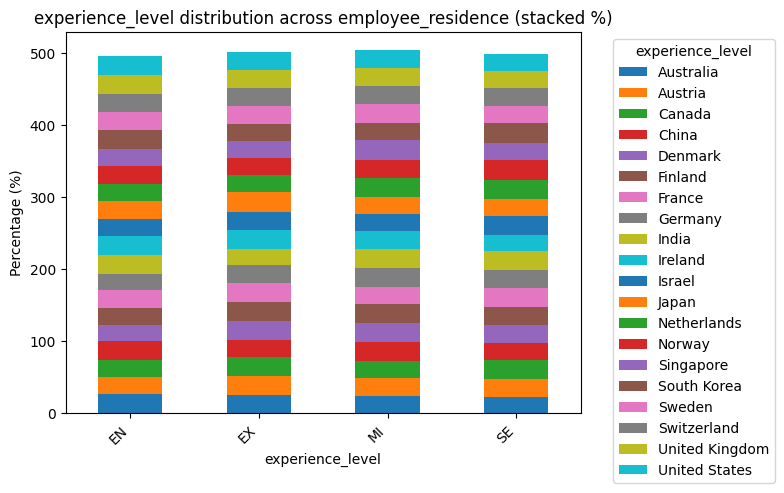

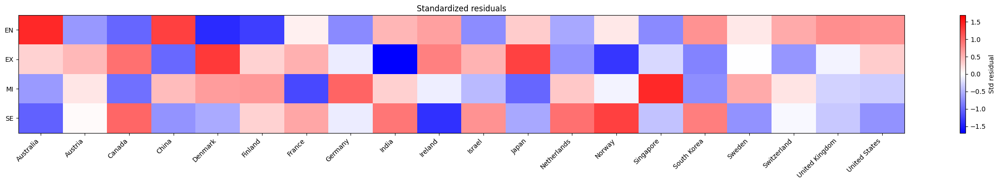


Analysis: experience_level vs remote_ratio
------------------------------------------------------------
Contingency table (counts):
remote_ratio         0   100    50
experience_level                  
EN                1290  1183  1245
EX                1244  1261  1255
MI                1273  1223  1285
SE                1268  1253  1220

Chi2 = 5.066394
Degrees of freedom = 6
p-value = 0.535326 
n = 15000, table shape = 4 x 3

Expected frequencies:
remote_ratio            0      100       50
experience_level                           
EN                1257.92  1219.50  1240.57
EX                1272.13  1233.28  1254.59
MI                1279.24  1240.17  1261.59
SE                1265.70  1227.05  1248.25

Standardized residuals (obs - exp) / sqrt(exp):
remote_ratio          0    100     50
experience_level                     
EN                0.904 -1.045  0.126
EX               -0.789  0.789  0.012
MI               -0.174 -0.488  0.659
SE                0.065  0.741 -0.800

D

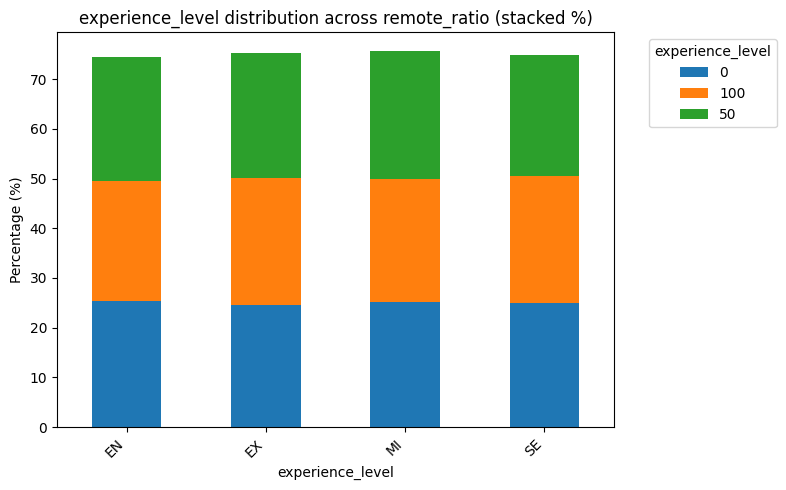

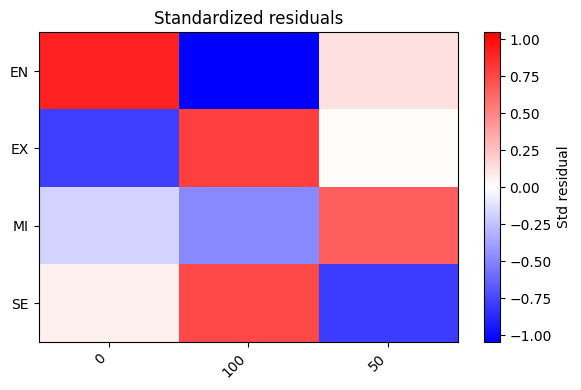


Analysis: experience_level vs education_required
------------------------------------------------------------
Contingency table (counts):
education_required  Associate  Bachelor  Master  PhD
experience_level                                    
EN                        938       943     896  941
EX                        947       956    1000  857
MI                        976       948     927  930
SE                        924       942     925  950

Chi2 = 13.248003
Degrees of freedom = 9
p-value = 0.151702 
n = 15000, table shape = 4 x 4

Expected frequencies:
education_required  Associate  Bachelor  Master     PhD
experience_level                                       
EN                     938.18    939.17  929.00  911.65
EX                     948.77    949.78  939.50  921.95
MI                     954.07    955.08  944.75  927.10
SE                     943.98    944.98  934.75  917.29

Standardized residuals (obs - exp) / sqrt(exp):
education_required  Associate  Bachelor  Ma

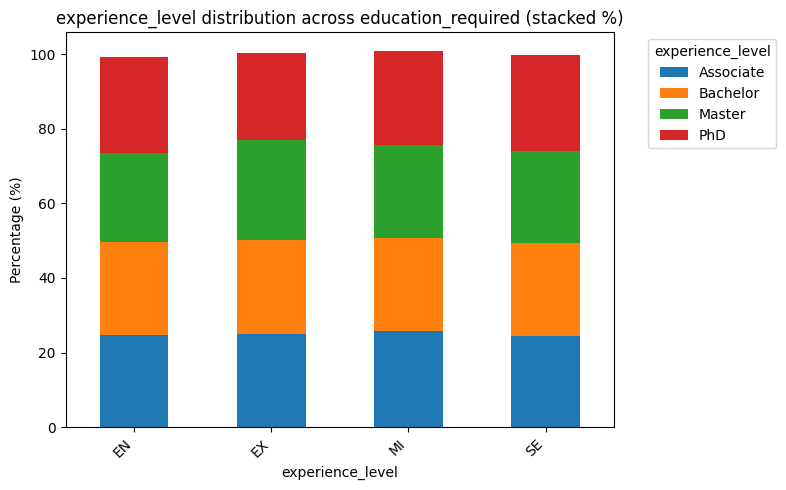

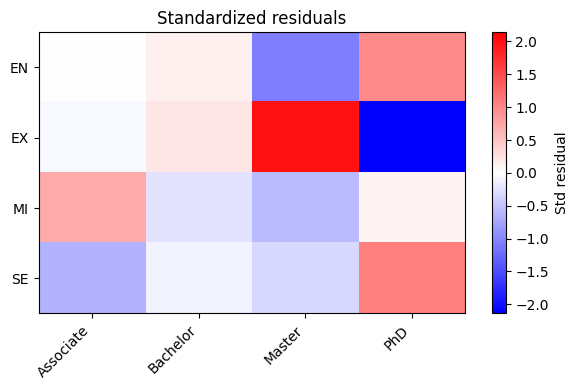


Analysis: experience_level vs industry
------------------------------------------------------------
Contingency table (counts):
industry          Automotive  Consulting  Education  Energy  Finance  Gaming  \
experience_level                                                               
EN                       275         245        228     229      245     267   
EX                       243         274        241     265      247     234   
MI                       249         246        257     258      249     245   
SE                       253         255        230     224      243     221   

industry          Government  Healthcare  Manufacturing  Media  Real Estate  \
experience_level                                                              
EN                       227         252            242    252          255   
EX                       248         257            236    279          239   
MI                       271         250            211    261          26

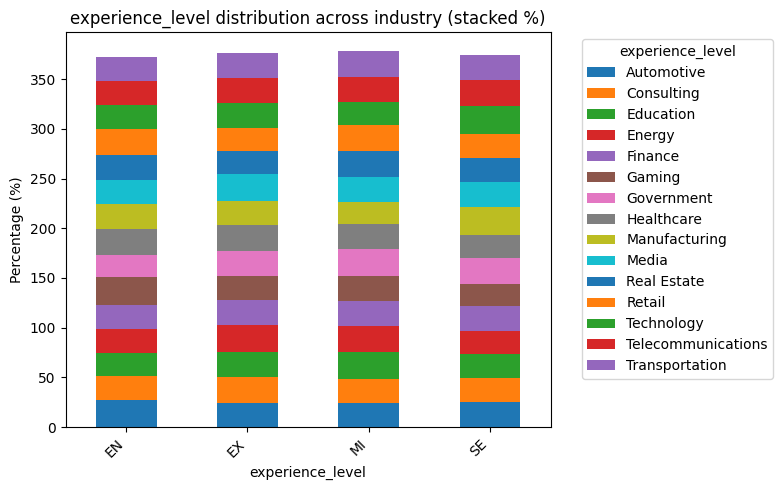

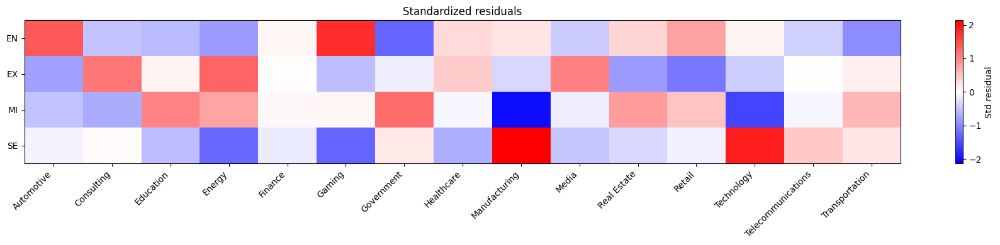


Analysis: experience_level vs company_name
------------------------------------------------------------
Contingency table (counts):
company_name      AI Innovations  Advanced Robotics  Algorithmic Solutions  \
experience_level                                                             
EN                           260                252                    231   
EX                           221                226                    198   
MI                           254                225                    217   
SE                           229                222                    239   

company_name      Autonomous Tech  Cloud AI Solutions  Cognitive Computing  \
experience_level                                                             
EN                            213                 218                  257   
EX                            229                 245                  211   
MI                            248                 252                  244   
SE      

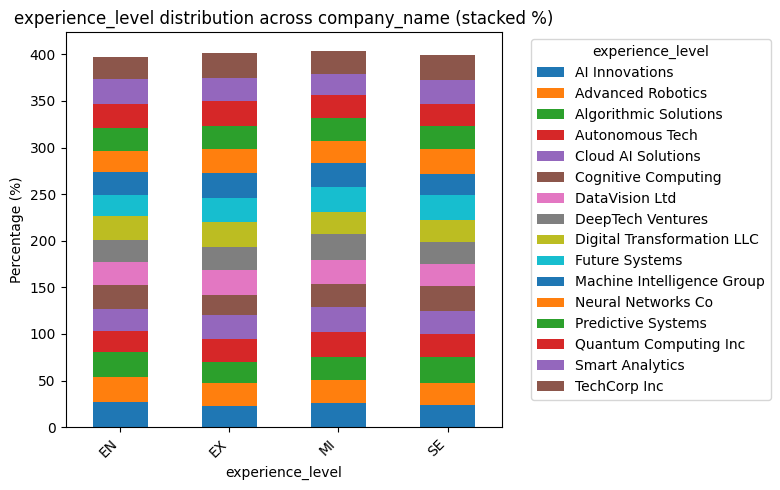

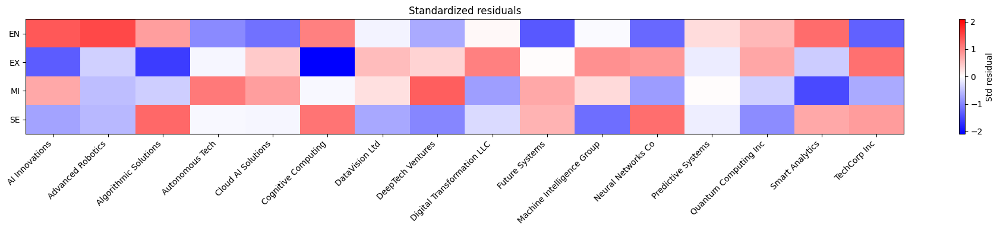


Analysis: employment_type vs company_location
------------------------------------------------------------
Contingency table (counts):
company_location  Australia  Austria  Canada  China  Denmark  Finland  France  \
employment_type                                                                 
CT                      174      176     191    181      185      180     195   
FL                      189      198     190    190      192      200     203   
FT                      182      197     214    187      208      175     196   
PT                      187      194     174    205      193      178     175   

company_location  Germany  India  Ireland  Israel  Japan  Netherlands  Norway  \
employment_type                                                                 
CT                    217    205      182     165    180          199     179   
FL                    206    188      174     190    191          170     194   
FT                    204    167      183     207    

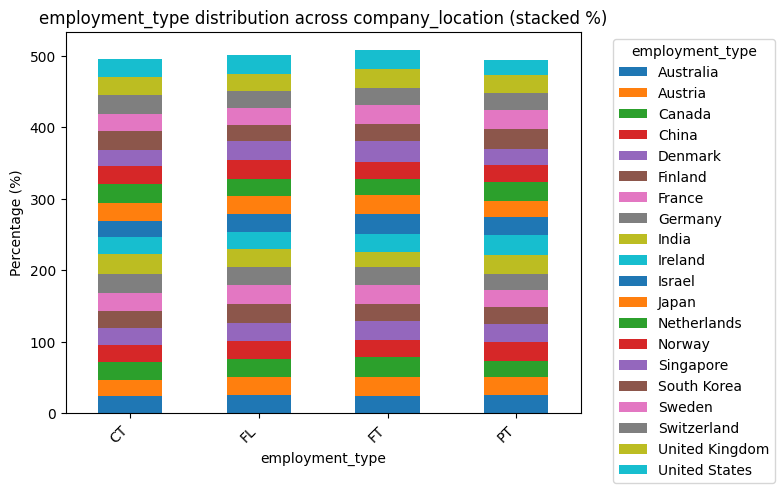

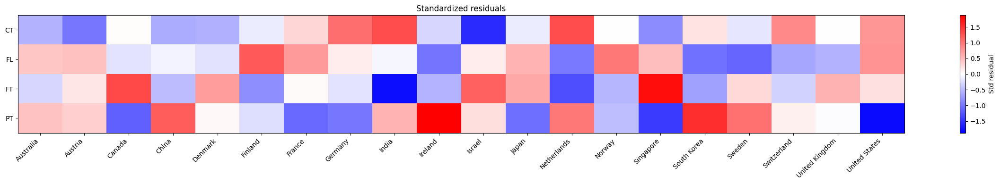


Analysis: employment_type vs company_size
------------------------------------------------------------
Contingency table (counts):
company_size        L     M     S
employment_type                  
CT               1220  1230  1271
FL               1265  1246  1247
FT               1272  1285  1255
PT               1241  1234  1234

Chi2 = 1.726364
Degrees of freedom = 6
p-value = 0.943068 
n = 15000, table shape = 4 x 3

Expected frequencies:
company_size           L        M        S
employment_type                           
CT               1239.84  1239.09  1242.07
FL               1252.17  1251.41  1254.42
FT               1270.16  1269.40  1272.45
PT               1235.84  1235.10  1238.06

Standardized residuals (obs - exp) / sqrt(exp):
company_size         L      M      S
employment_type                     
CT              -0.563 -0.258  0.821
FL               0.363 -0.153 -0.210
FT               0.052  0.438 -0.489
PT               0.147 -0.031 -0.116

Distribution of empl

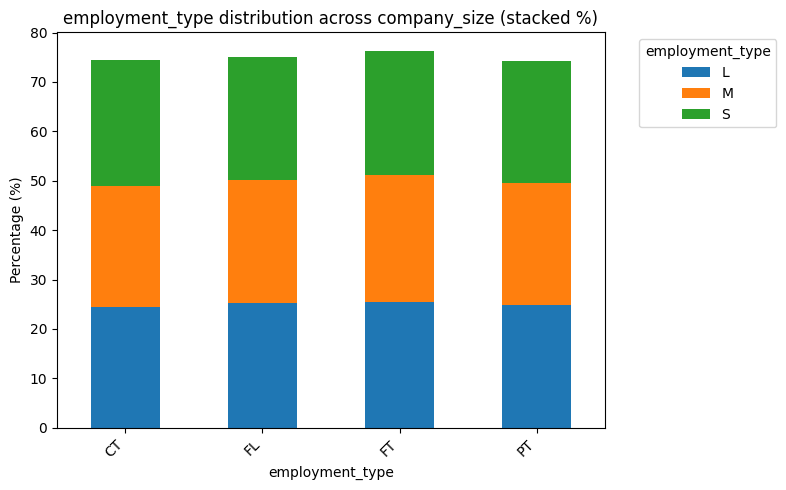

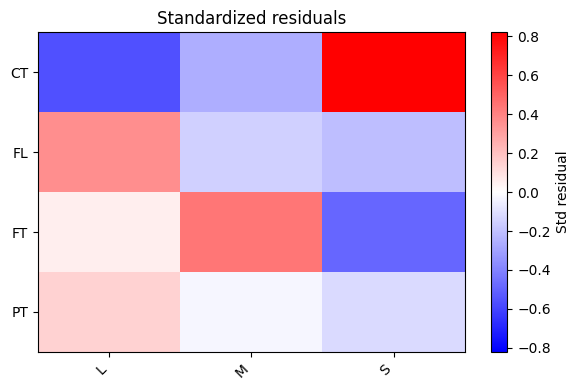


Analysis: employment_type vs employee_residence
------------------------------------------------------------
Contingency table (counts):
employee_residence  Australia  Austria  Canada  China  Denmark  Finland  \
employment_type                                                           
CT                        178      189     177    194      188      173   
FL                        187      203     187    182      197      186   
FT                        185      195     211    194      198      176   
PT                        180      189     187    191      194      175   

employee_residence  France  Germany  India  Ireland  Israel  Japan  \
employment_type                                                      
CT                     191      195    202      190     173    167   
FL                     191      183    194      182     188    179   
FT                     209      190    177      172     196    187   
PT                     190      201    199      196     174  

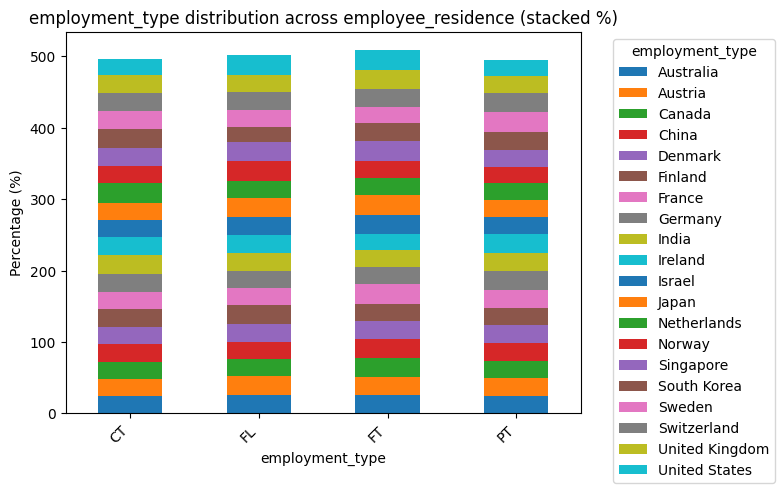

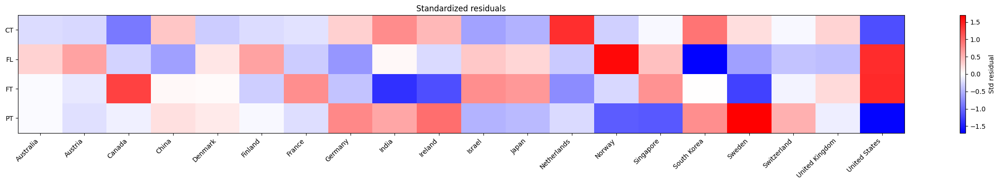


Analysis: employment_type vs remote_ratio
------------------------------------------------------------
Contingency table (counts):
remote_ratio        0   100    50
employment_type                  
CT               1216  1264  1241
FL               1298  1232  1228
FT               1303  1244  1265
PT               1258  1180  1271

Chi2 = 6.321815
Degrees of freedom = 6
p-value = 0.388122 
n = 15000, table shape = 4 x 3

Expected frequencies:
remote_ratio           0      100       50
employment_type                           
CT               1258.94  1220.49  1241.57
FL               1271.46  1232.62  1253.92
FT               1289.73  1250.34  1271.94
PT               1254.88  1216.55  1237.57

Standardized residuals (obs - exp) / sqrt(exp):
remote_ratio         0    100     50
employment_type                     
CT              -1.210  1.245 -0.016
FL               0.744 -0.018 -0.732
FT               0.370 -0.179 -0.195
PT               0.088 -1.048  0.950

Distribution of empl

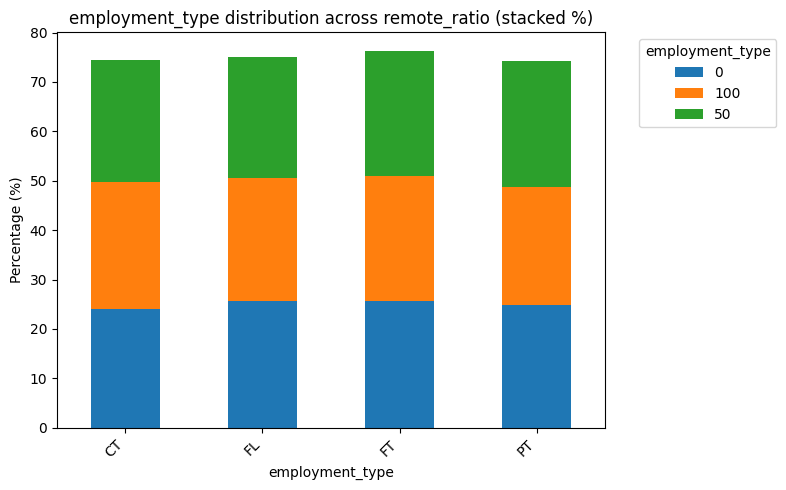

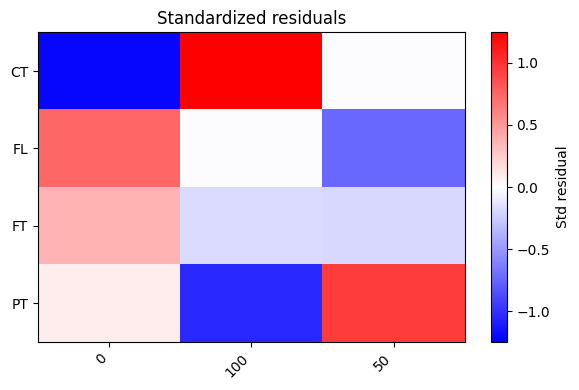


Analysis: employment_type vs education_required
------------------------------------------------------------
Contingency table (counts):
education_required  Associate  Bachelor  Master  PhD
employment_type                                     
CT                        957       926     915  923
FL                        930       964     903  961
FT                        980      1014     958  860
PT                        918       885     972  934

Chi2 = 19.710725
Degrees of freedom = 9
p-value = 0.019784 
n = 15000, table shape = 4 x 4

Expected frequencies:
education_required  Associate  Bachelor  Master     PhD
employment_type                                        
CT                     938.93    939.92  929.75  912.39
FL                     948.27    949.27  939.00  921.46
FT                     961.89    962.91  952.49  934.70
PT                     935.90    936.89  926.76  909.45

Standardized residuals (obs - exp) / sqrt(exp):
education_required  Associate  Bachelor  Mas

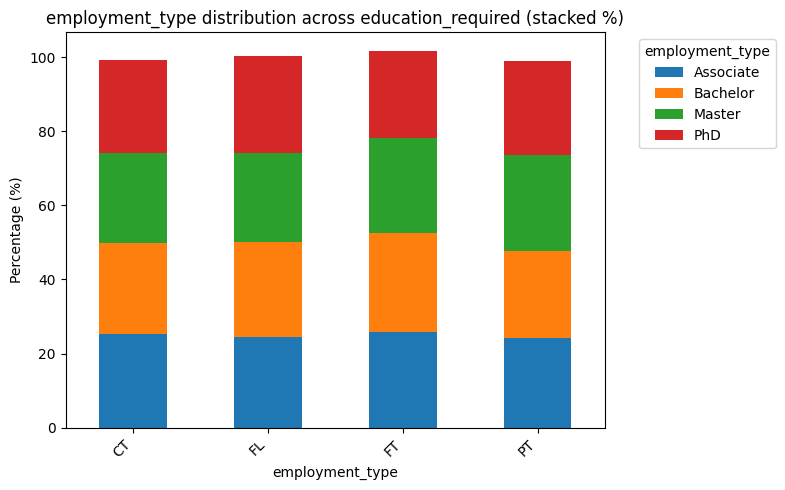

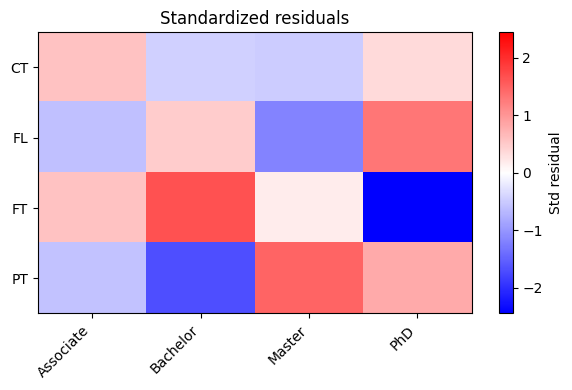


Analysis: employment_type vs industry
------------------------------------------------------------
Contingency table (counts):
industry         Automotive  Consulting  Education  Energy  Finance  Gaming  \
employment_type                                                               
CT                      240         262        253     256      262     248   
FL                      282         249        252     239      229     224   
FT                      241         256        242     250      250     253   
PT                      257         253        209     231      243     242   

industry         Government  Healthcare  Manufacturing  Media  Real Estate  \
employment_type                                                              
CT                      229         235            223    256          221   
FL                      250         275            242    280          249   
FT                      251         224            260    260          279   
PT     

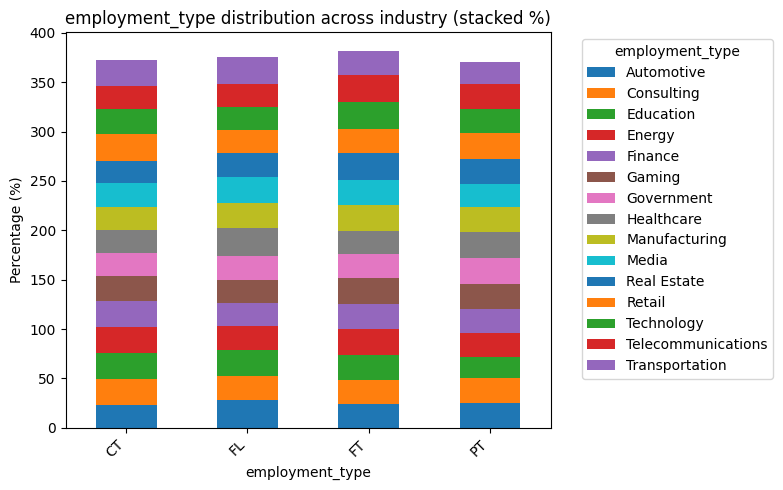

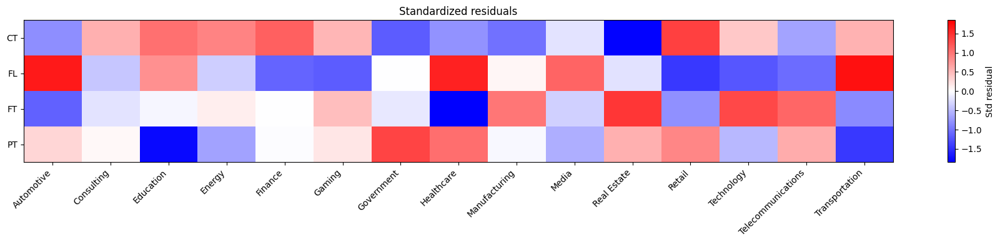


Analysis: employment_type vs company_name
------------------------------------------------------------
Contingency table (counts):
company_name     AI Innovations  Advanced Robotics  Algorithmic Solutions  \
employment_type                                                             
CT                          234                242                    233   
FL                          241                232                    224   
FT                          244                223                    215   
PT                          245                228                    213   

company_name     Autonomous Tech  Cloud AI Solutions  Cognitive Computing  \
employment_type                                                             
CT                           236                 237                  248   
FL                           219                 247                  251   
FT                           248                 238                  242   
PT                  

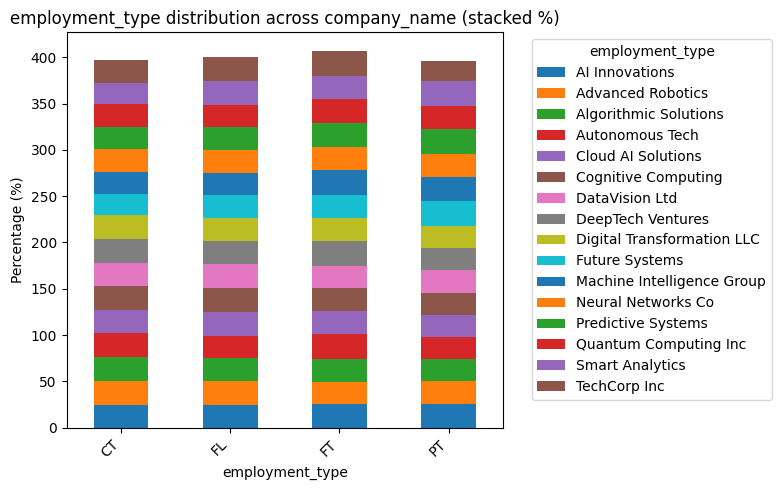

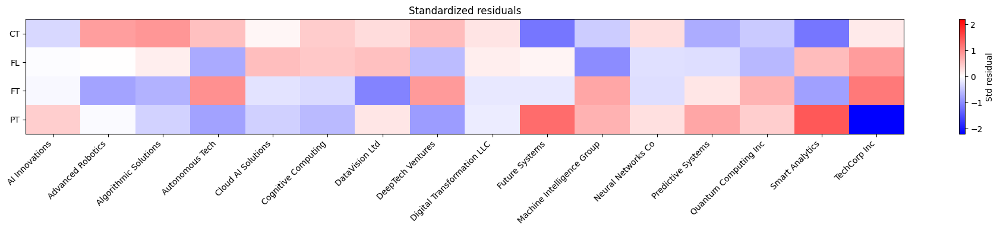


Analysis: company_location vs company_size
------------------------------------------------------------
Contingency table (counts):
company_size        L    M    S
company_location               
Australia         244  247  241
Austria           242  289  234
Canada            249  255  265
China             239  257  267
Denmark           274  251  253
Finland           244  242  247
France            260  246  263
Germany           266  247  301
India             234  258  262
Ireland           255  251  244
Israel            261  233  257
Japan             228  237  268
Netherlands       237  261  233
Norway            259  246  216
Singapore         265  229  270
South Korea       257  240  225
Sweden            265  249  238
Switzerland       235  265  246
United Kingdom    222  255  252
United States     262  237  225

Chi2 = 45.066694
Degrees of freedom = 38
p-value = 0.200275 
n = 15000, table shape = 20 x 3

Expected frequencies:
company_size           L       M       S
compa

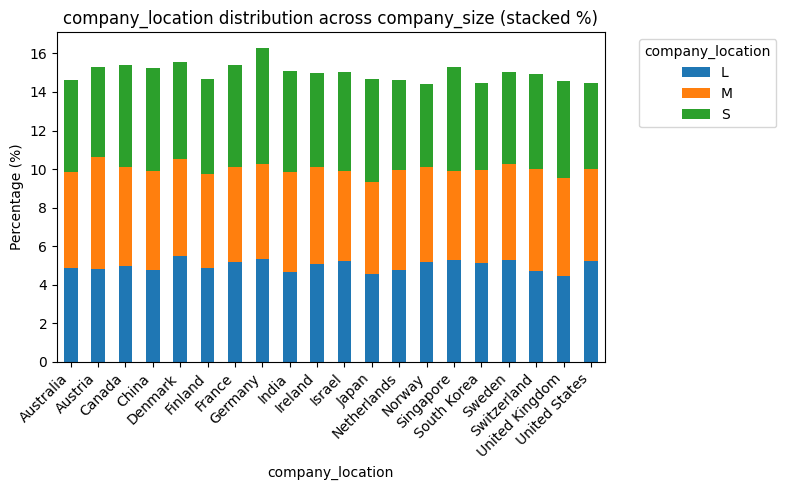

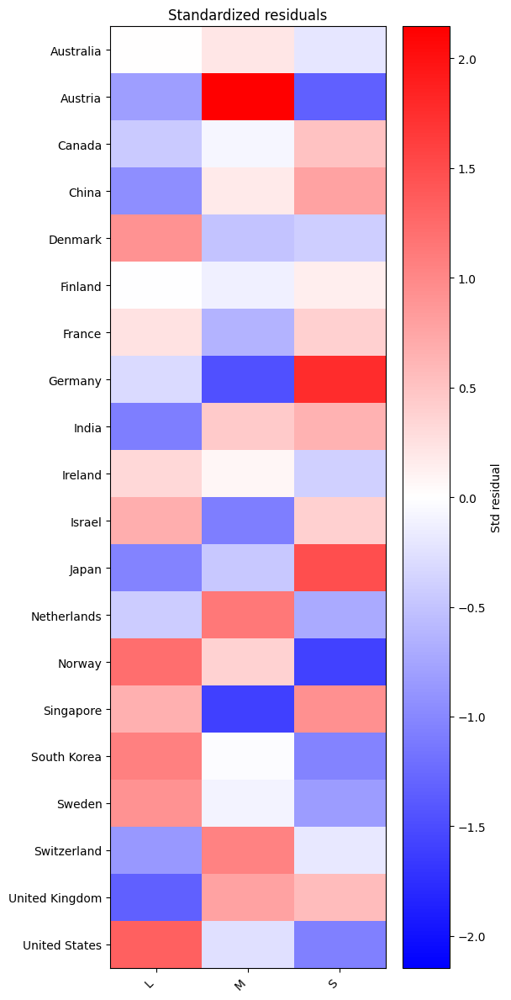


Analysis: company_location vs employee_residence
------------------------------------------------------------
Contingency table (counts):
employee_residence  Australia  Austria  Canada  China  Denmark  Finland  \
company_location                                                          
Australia                 528       12       6      7        6       10   
Austria                     9      551      10     15       13       11   
Canada                     13        8     552     12        8        8   
China                      12       13      19    548       13       10   
Denmark                    10       14      16     18      548        8   
Finland                    11        6      11      9       18      527   
France                      8       21      15     13       10        7   
Germany                    11       12      15     13       15       10   
India                       8       14      13      8       16       11   
Ireland                     7       

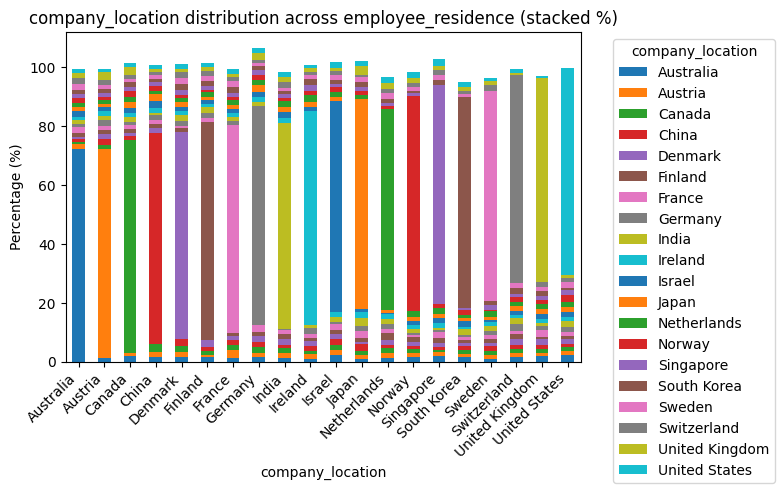

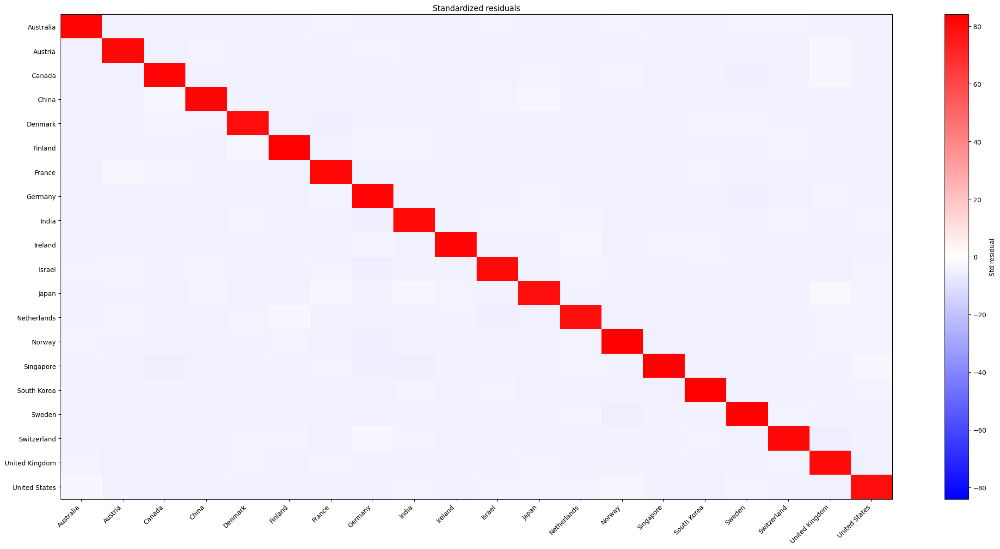


Analysis: company_location vs remote_ratio
------------------------------------------------------------
Contingency table (counts):
remote_ratio        0  100   50
company_location               
Australia         238  250  244
Austria           253  266  246
Canada            256  255  258
China             263  271  229
Denmark           255  258  265
Finland           269  220  244
France            256  251  262
Germany           280  245  289
India             244  261  249
Ireland           241  269  240
Israel            241  241  269
Japan             262  227  244
Netherlands       258  235  238
Norway            247  234  240
Singapore         258  248  258
South Korea       239  231  252
Sweden            245  262  245
Switzerland       251  239  256
United Kingdom    260  214  255
United States     259  243  222

Chi2 = 31.743890
Degrees of freedom = 38
p-value = 0.752892 
n = 15000, table shape = 20 x 3

Expected frequencies:
remote_ratio           0     100      50
compa

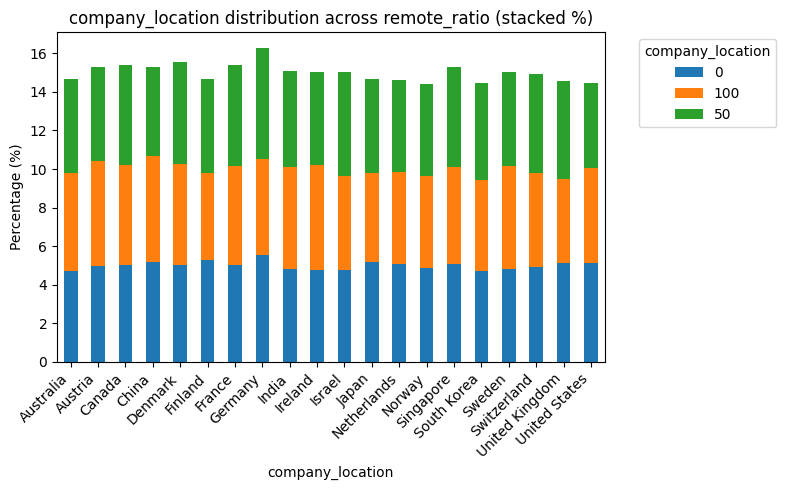

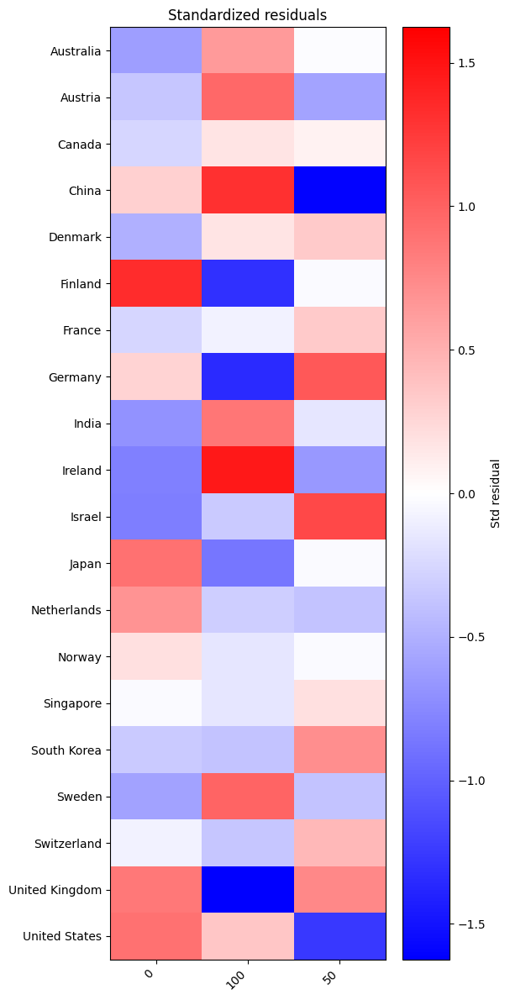


Analysis: company_location vs education_required
------------------------------------------------------------
Contingency table (counts):
education_required  Associate  Bachelor  Master  PhD
company_location                                    
Australia                 191       176     185  180
Austria                   195       196     199  175
Canada                    188       209     189  183
China                     183       194     199  187
Denmark                   209       203     195  171
Finland                   184       197     172  180
France                    201       189     190  189
Germany                   217       209     179  209
India                     208       196     171  179
Ireland                   187       188     186  189
Israel                    197       182     172  200
Japan                     168       174     199  192
Netherlands               181       188     183  179
Norway                    164       178     194  185
Singapore    

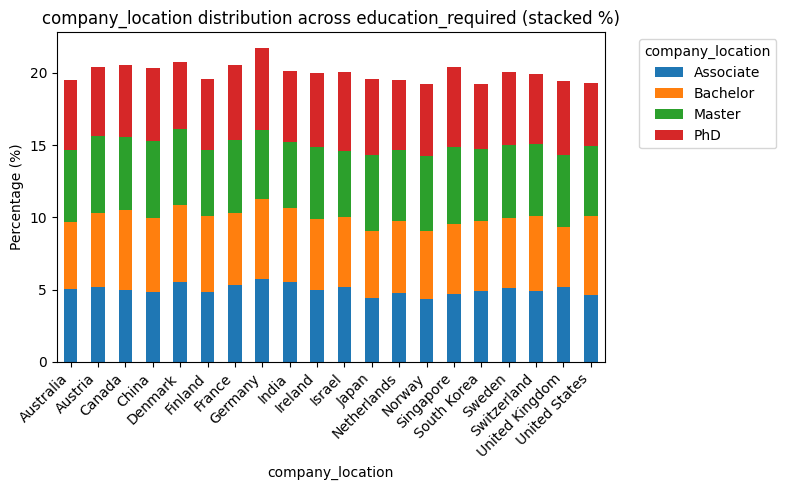

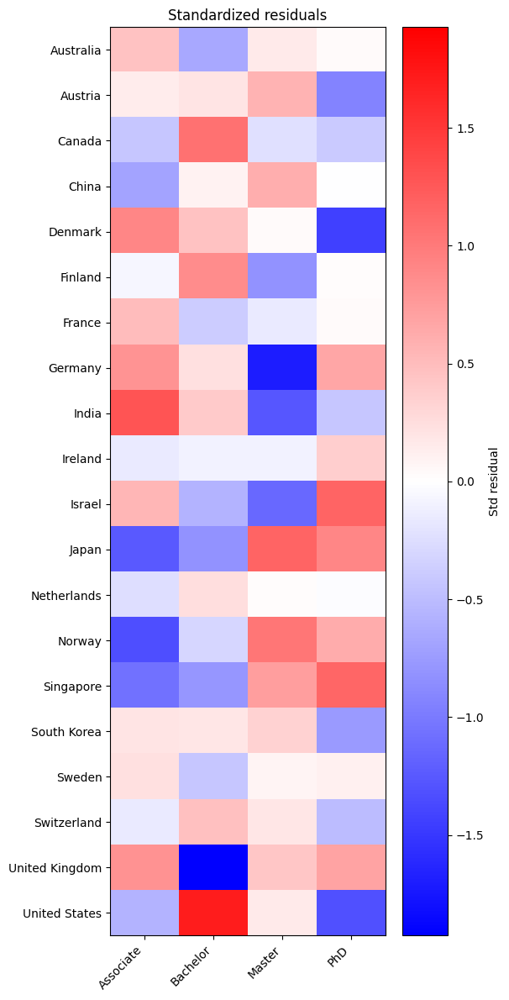


Analysis: company_location vs industry
------------------------------------------------------------
Contingency table (counts):
industry          Automotive  Consulting  Education  Energy  Finance  Gaming  \
company_location                                                               
Australia                 55          44         41      51       41      49   
Austria                   53          52         56      48       41      51   
Canada                    44          48         53      57       44      57   
China                     50          54         49      50       42      53   
Denmark                   61          55         45      40       69      51   
Finland                   48          53         35      60       50      41   
France                    50          48         50      38       61      49   
Germany                   61          56         52      37       60      51   
India                     43          58         47      46       28   

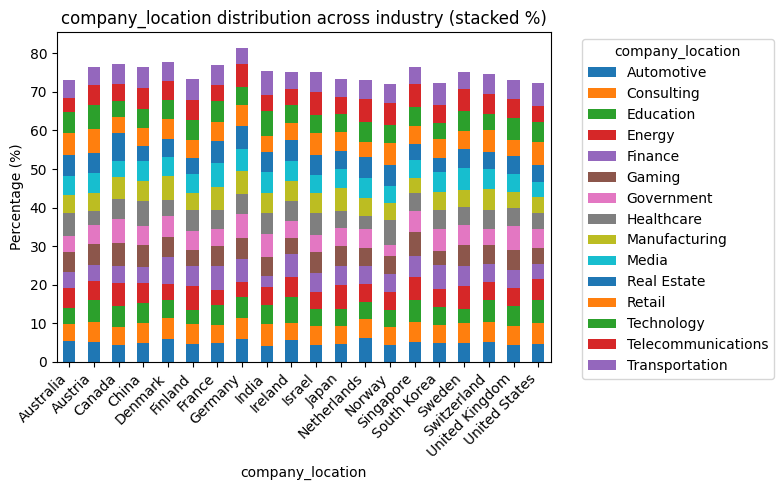

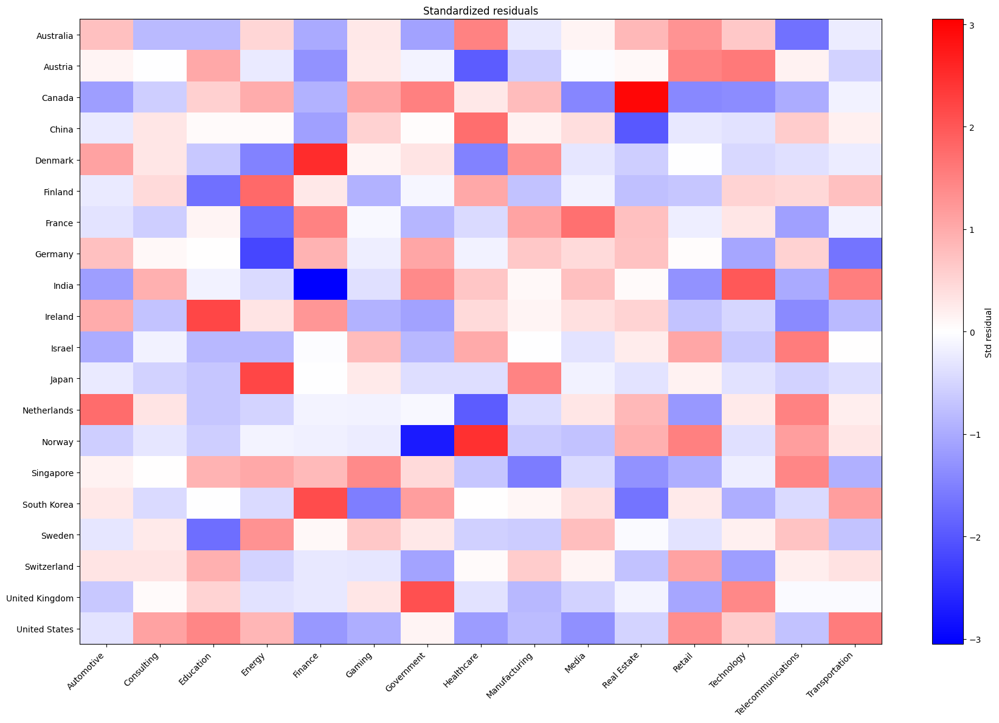


Analysis: company_location vs company_name
------------------------------------------------------------
Contingency table (counts):
company_name      AI Innovations  Advanced Robotics  Algorithmic Solutions  \
company_location                                                             
Australia                     51                 48                     35   
Austria                       52                 45                     31   
Canada                        49                 42                     55   
China                         53                 39                     53   
Denmark                       61                 45                     43   
Finland                       43                 47                     40   
France                        45                 60                     53   
Germany                       50                 48                     46   
India                         51                 56                     54   
Ireland  

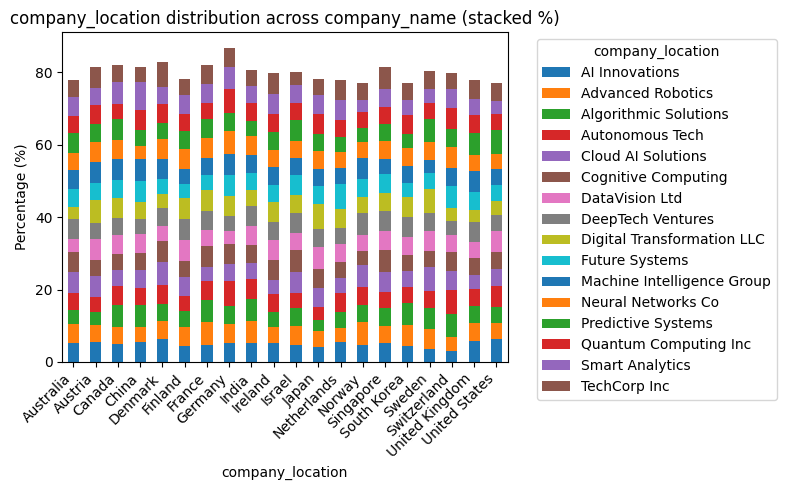

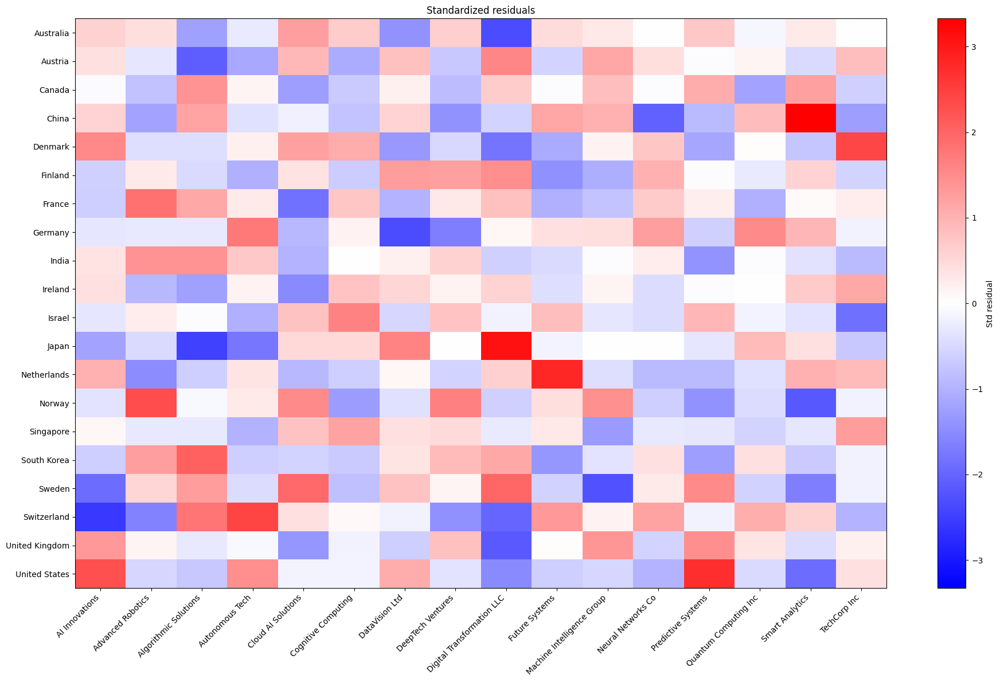


Analysis: company_size vs employee_residence
------------------------------------------------------------
Contingency table (counts):
employee_residence  Australia  Austria  Canada  China  Denmark  Finland  \
company_size                                                              
L                         239      247     259    245      270      237   
M                         251      277     248    266      250      232   
S                         240      252     255    250      257      241   

employee_residence  France  Germany  India  Ireland  Israel  Japan  \
company_size                                                         
L                      235      248    242      258     270    230   
M                      259      248    279      240     218    221   
S                      287      273    251      242     243    249   

employee_residence  Netherlands  Norway  Singapore  South Korea  Sweden  \
company_size                                                   

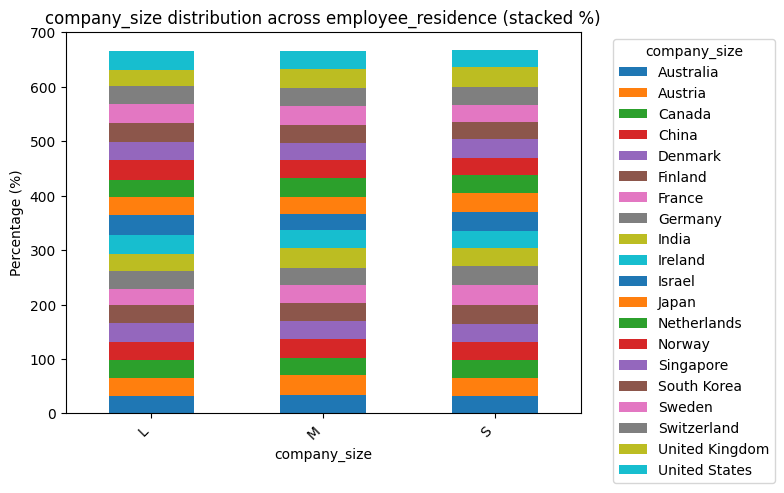

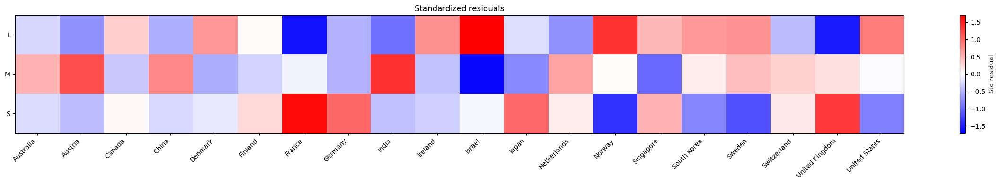


Analysis: company_size vs remote_ratio
------------------------------------------------------------
Contingency table (counts):
remote_ratio     0   100    50
company_size                  
L             1680  1625  1693
M             1695  1680  1620
S             1700  1615  1692

Chi2 = 3.708647
Degrees of freedom = 4
p-value = 0.446869 
n = 15000, table shape = 3 x 3

Expected frequencies:
remote_ratio        0      100       50
company_size                           
L             1690.99  1639.34  1667.67
M             1689.98  1638.36  1666.66
S             1694.04  1642.30  1670.67

Standardized residuals (obs - exp) / sqrt(exp):
remote_ratio      0    100     50
company_size                     
L            -0.267 -0.354  0.620
M             0.122  1.029 -1.143
S             0.145 -0.674  0.522

Distribution of company_size within each remote_ratio (%) :
remote_ratio     0    100     50
company_size                    
L             33.1  33.03  33.83
M             33.4  34.

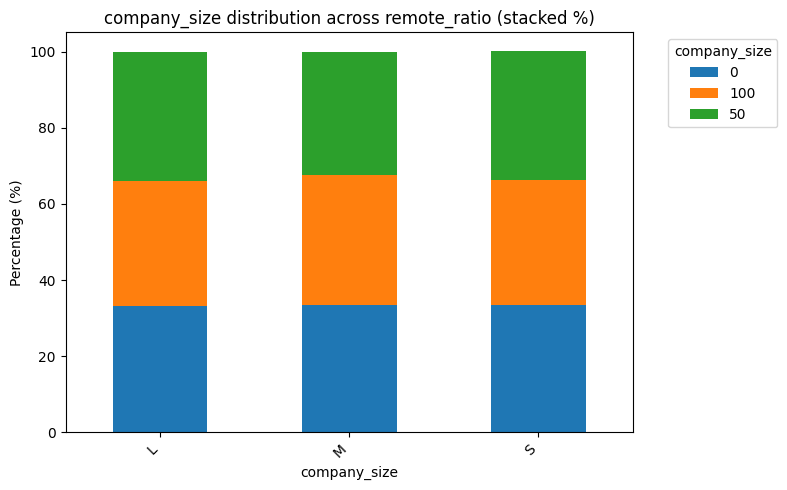

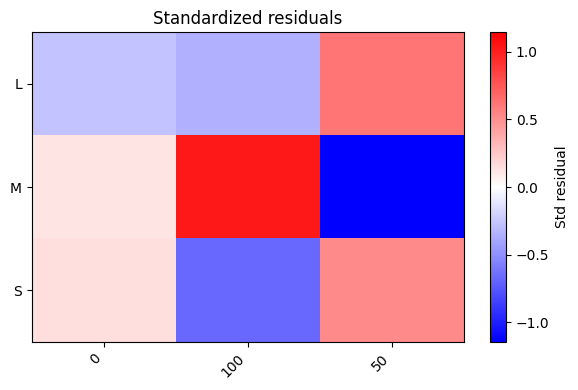


Analysis: company_size vs education_required
------------------------------------------------------------
Contingency table (counts):
education_required  Associate  Bachelor  Master   PhD
company_size                                         
L                        1254      1255    1252  1237
M                        1251      1266    1268  1210
S                        1280      1268    1228  1231

Chi2 = 1.441675
Degrees of freedom = 6
p-value = 0.963274 
n = 15000, table shape = 3 x 4

Expected frequencies:
education_required  Associate  Bachelor   Master      PhD
company_size                                             
L                     1261.16   1262.49  1248.83  1225.51
M                     1260.40   1261.74  1248.08  1224.77
S                     1263.43   1264.77  1251.08  1227.72

Standardized residuals (obs - exp) / sqrt(exp):
education_required  Associate  Bachelor  Master    PhD
company_size                                          
L                      -0.202   

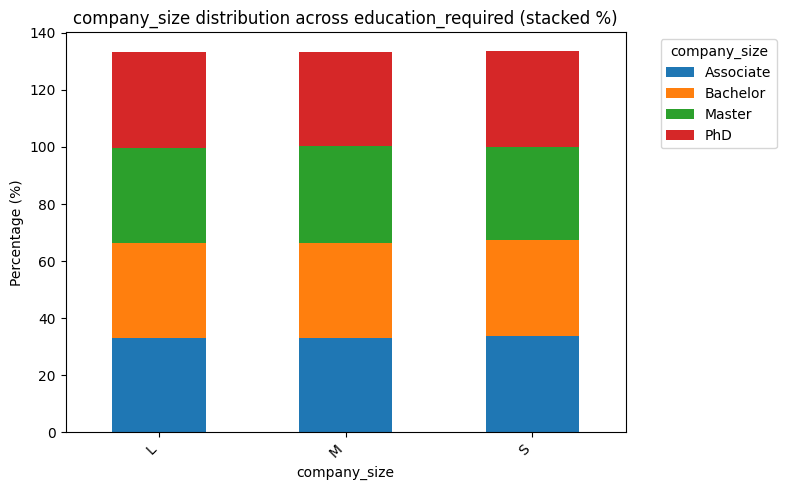

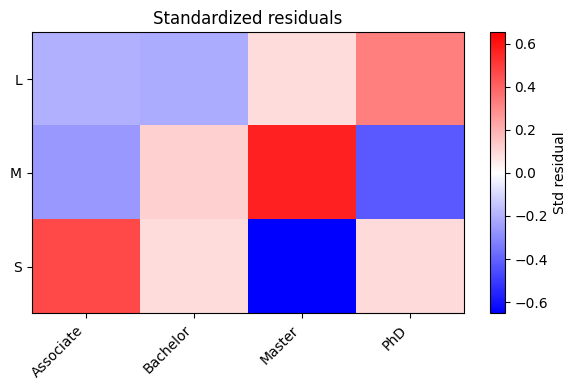


Analysis: company_size vs industry
------------------------------------------------------------
Contingency table (counts):
industry      Automotive  Consulting  Education  Energy  Finance  Gaming  \
company_size                                                               
L                    349         348        318     305      322     286   
M                    316         336        330     329      326     342   
S                    355         336        308     342      336     339   

industry      Government  Healthcare  Manufacturing  Media  Real Estate  \
company_size                                                              
L                    361         333            329    352          349   
M                    314         331            319    347          341   
S                    323         333            314    346          317   

industry      Retail  Technology  Telecommunications  Transportation  
company_size                                   

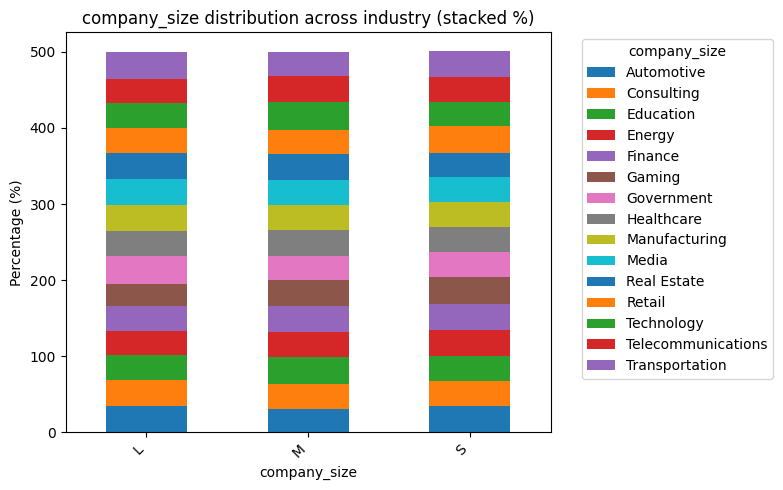

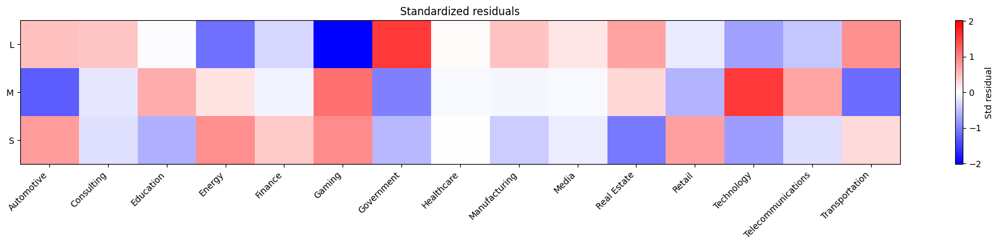


Analysis: company_size vs company_name
------------------------------------------------------------
Contingency table (counts):
company_name  AI Innovations  Advanced Robotics  Algorithmic Solutions  \
company_size                                                             
L                        303                302                    296   
M                        317                323                    307   
S                        344                300                    282   

company_name  Autonomous Tech  Cloud AI Solutions  Cognitive Computing  \
company_size                                                             
L                         315                 318                  323   
M                         299                 320                  313   
S                         304                 313                  336   

company_name  DataVision Ltd  DeepTech Ventures  Digital Transformation LLC  \
company_size                                      

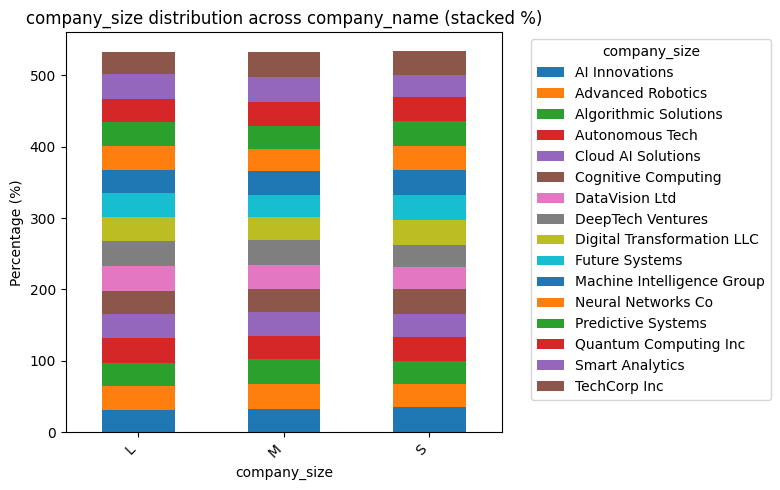

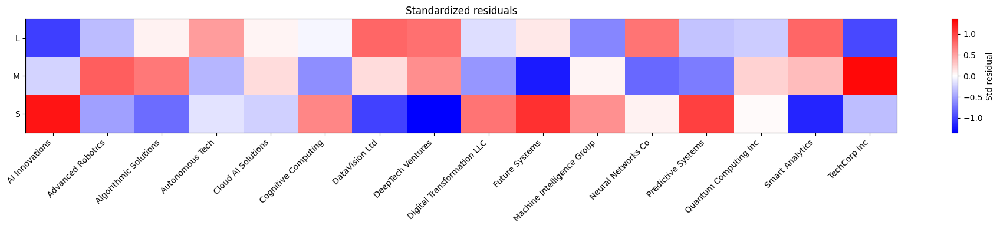


Analysis: employee_residence vs remote_ratio
------------------------------------------------------------
Contingency table (counts):
remote_ratio          0  100   50
employee_residence               
Australia           243  242  245
Austria             265  260  251
Canada              253  248  261
China               259  267  235
Denmark             257  258  262
Finland             263  214  233
France              273  230  278
Germany             264  247  258
India               242  268  262
Ireland             239  269  232
Israel              232  234  265
Japan               245  219  236
Netherlands         270  263  225
Norway              253  240  233
Singapore           252  233  255
South Korea         254  256  253
Sweden              264  274  252
Switzerland         244  235  269
United Kingdom      258  225  267
United States       245  238  233

Chi2 = 34.941878
Degrees of freedom = 38
p-value = 0.611634 
n = 15000, table shape = 20 x 3

Expected frequencies:


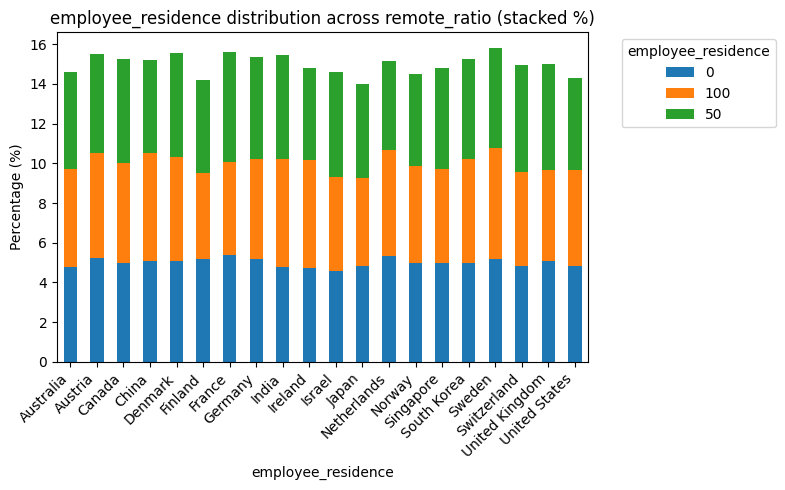

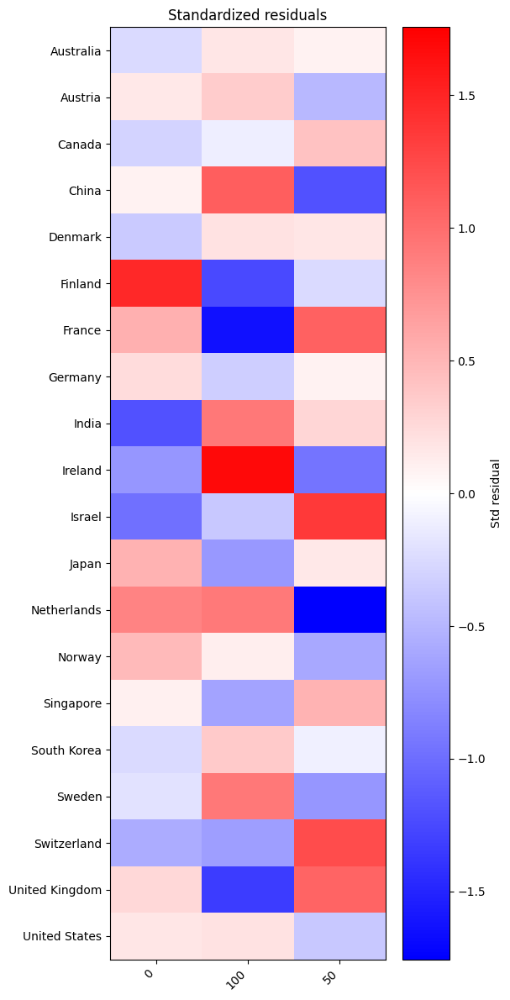


Analysis: employee_residence vs education_required
------------------------------------------------------------
Contingency table (counts):
education_required  Associate  Bachelor  Master  PhD
employee_residence                                  
Australia                 181       175     207  167
Austria                   195       196     190  195
Canada                    190       205     199  168
China                     190       212     193  166
Denmark                   213       199     188  177
Finland                   174       191     168  177
France                    201       195     199  186
Germany                   203       187     183  196
India                     196       199     185  192
Ireland                   177       193     176  194
Israel                    177       187     179  188
Japan                     171       169     182  178
Netherlands               186       181     195  196
Norway                    177       179     181  189
Singapore  

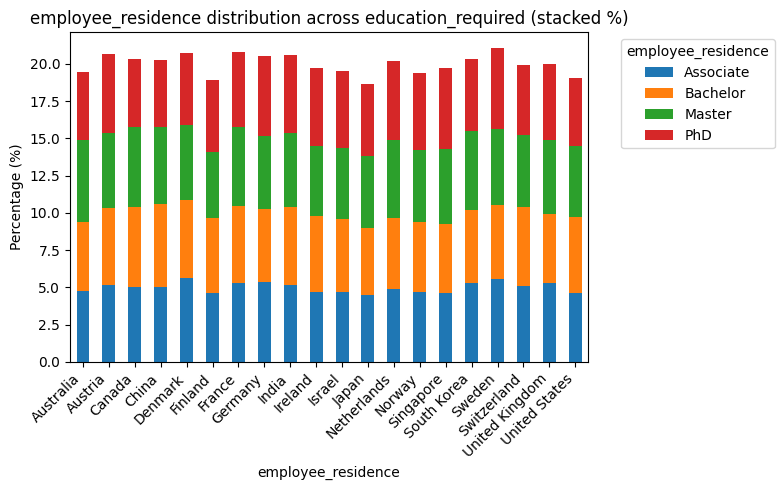

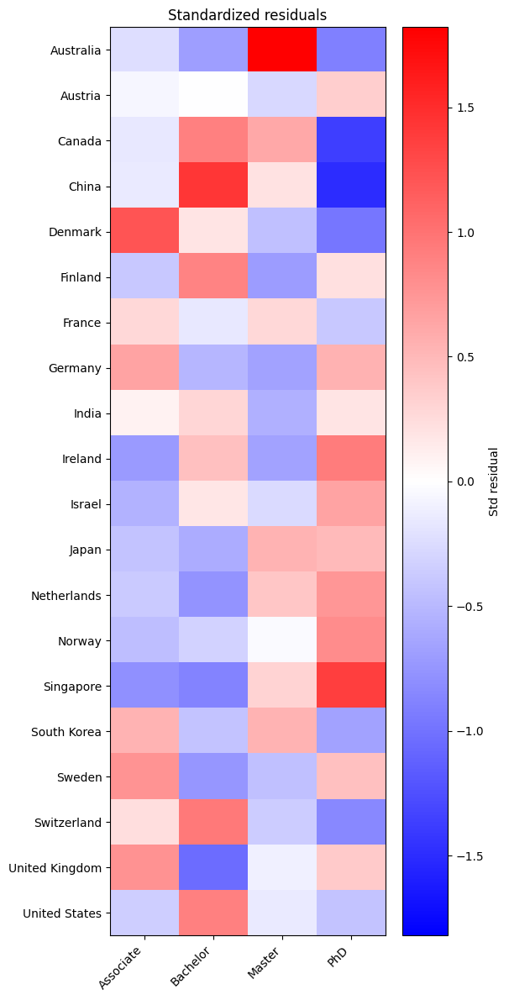


Analysis: employee_residence vs industry
------------------------------------------------------------
Contingency table (counts):
industry            Automotive  Consulting  Education  Energy  Finance  \
employee_residence                                                       
Australia                   49          43         44      52       38   
Austria                     55          61         47      55       40   
Canada                      42          51         45      54       49   
China                       44          53         51      48       52   
Denmark                     70          57         48      46       64   
Finland                     48          55         33      62       44   
France                      52          39         47      38       52   
Germany                     43          54         48      33       54   
India                       47          61         56      41       37   
Ireland                     52          49         59  

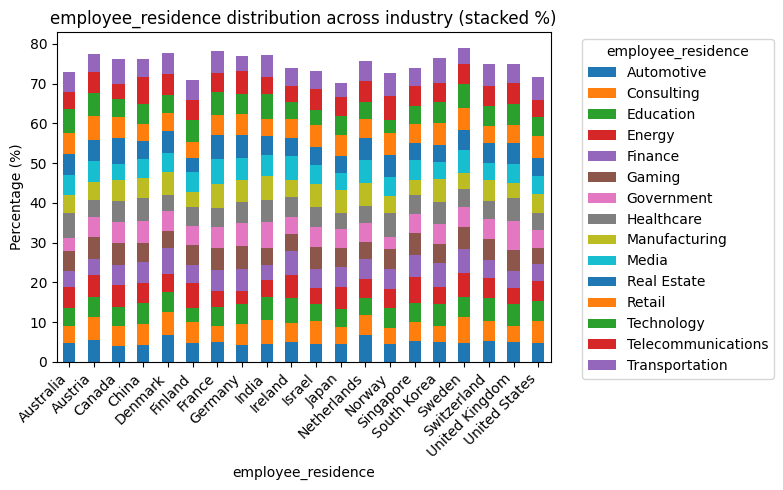

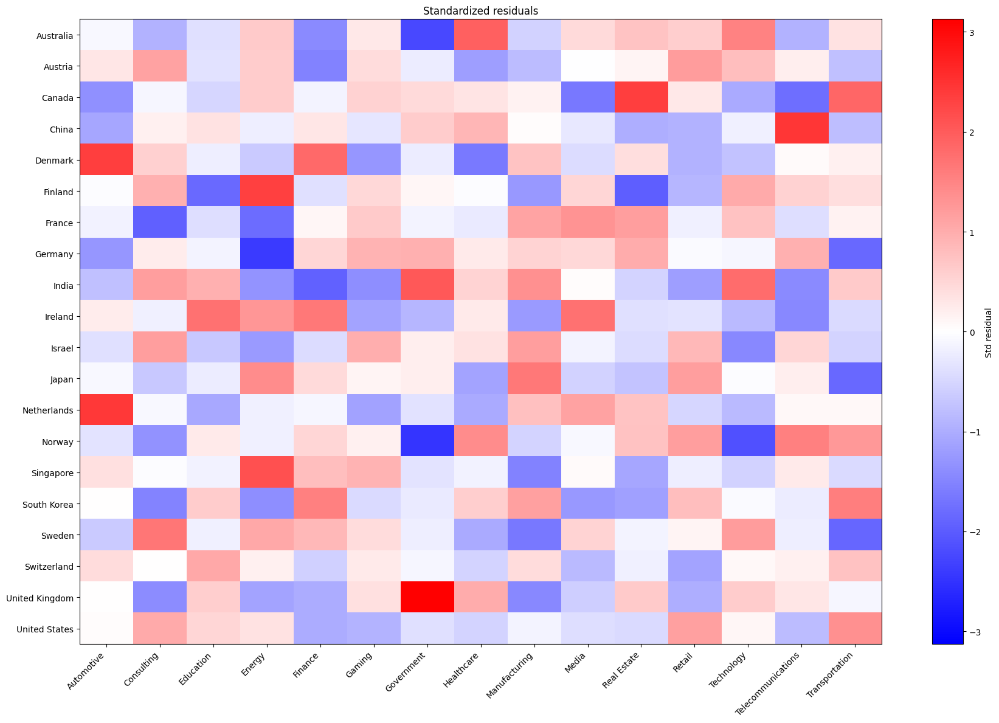


Analysis: employee_residence vs company_name
------------------------------------------------------------
Contingency table (counts):
company_name        AI Innovations  Advanced Robotics  Algorithmic Solutions  \
employee_residence                                                             
Australia                       50                 51                     32   
Austria                         53                 53                     35   
Canada                          53                 40                     49   
China                           53                 30                     53   
Denmark                         51                 40                     47   
Finland                         45                 45                     40   
France                          40                 51                     58   
Germany                         42                 46                     45   
India                           49                 60            

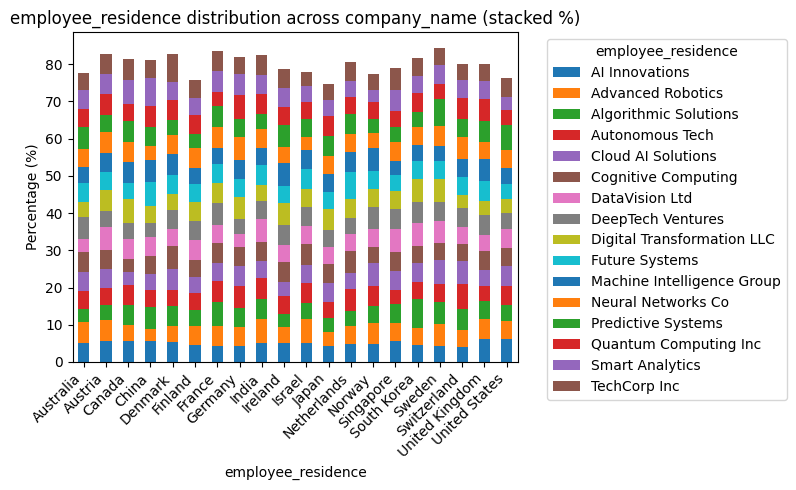

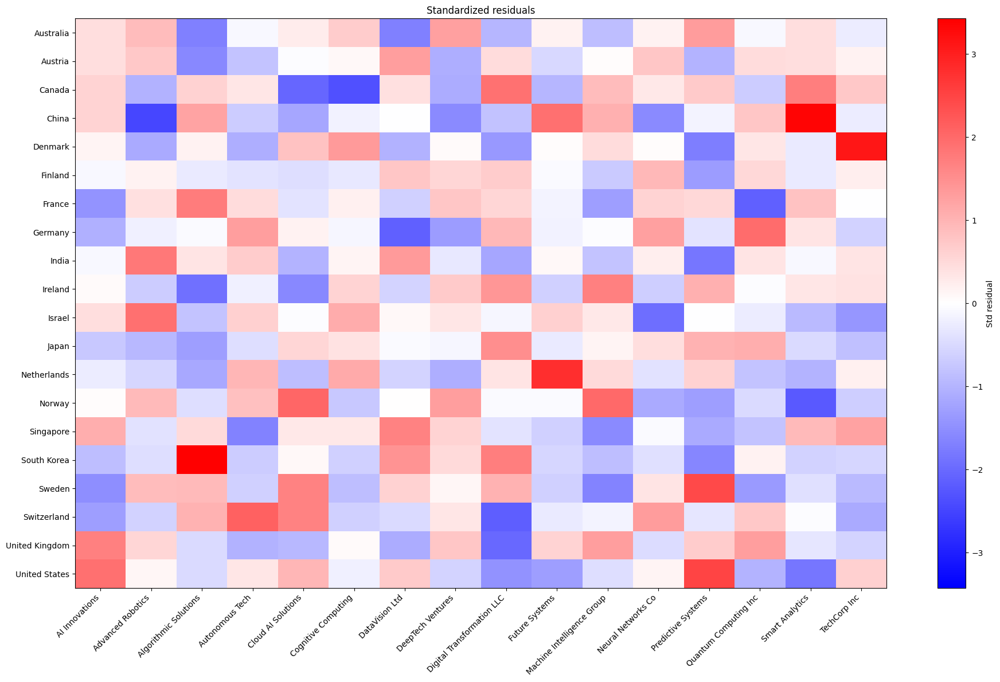


Analysis: remote_ratio vs education_required
------------------------------------------------------------
Contingency table (counts):
education_required  Associate  Bachelor  Master   PhD
remote_ratio                                         
0                        1272      1325    1261  1217
100                      1257      1231    1233  1199
50                       1256      1233    1254  1262

Chi2 = 4.313741
Degrees of freedom = 6
p-value = 0.634300 
n = 15000, table shape = 3 x 4

Expected frequencies:
education_required  Associate  Bachelor   Master      PhD
remote_ratio                                             
0                     1280.59   1281.94  1268.07  1244.39
100                   1241.48   1242.79  1229.34  1206.38
50                    1262.93   1264.26  1250.58  1227.23

Standardized residuals (obs - exp) / sqrt(exp):
education_required  Associate  Bachelor  Master    PhD
remote_ratio                                          
0                      -0.240   

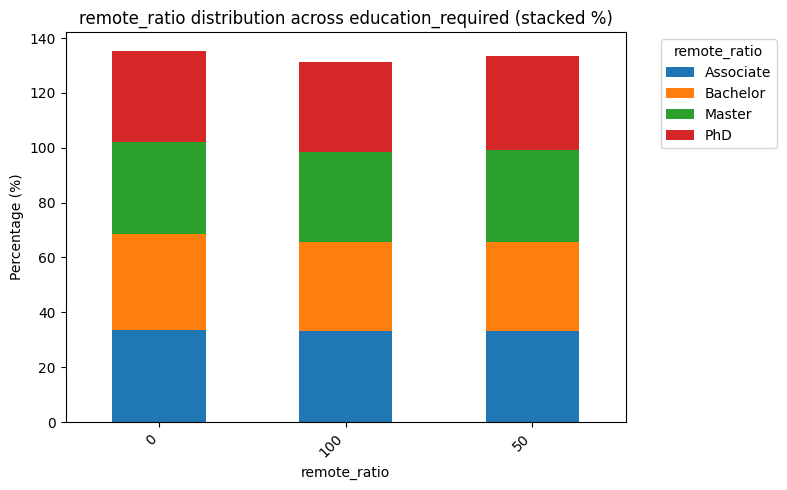

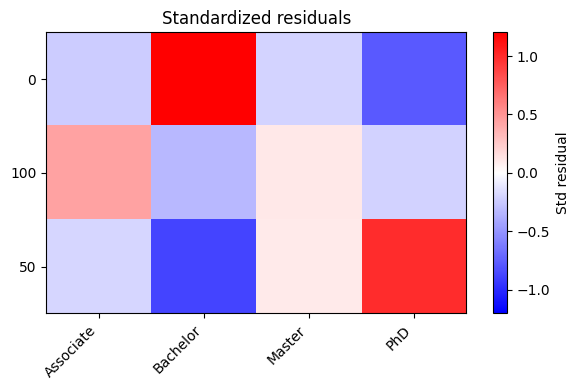


Analysis: remote_ratio vs industry
------------------------------------------------------------
Contingency table (counts):
industry      Automotive  Consulting  Education  Energy  Finance  Gaming  \
remote_ratio                                                               
0                    345         335        342     335      318     327   
100                  323         331        317     309      334     316   
50                   352         354        297     332      332     324   

industry      Government  Healthcare  Manufacturing  Media  Real Estate  \
remote_ratio                                                              
0                    346         336            323    363          312   
100                  336         322            310    353          336   
50                   316         339            329    329          359   

industry      Retail  Technology  Telecommunications  Transportation  
remote_ratio                                   

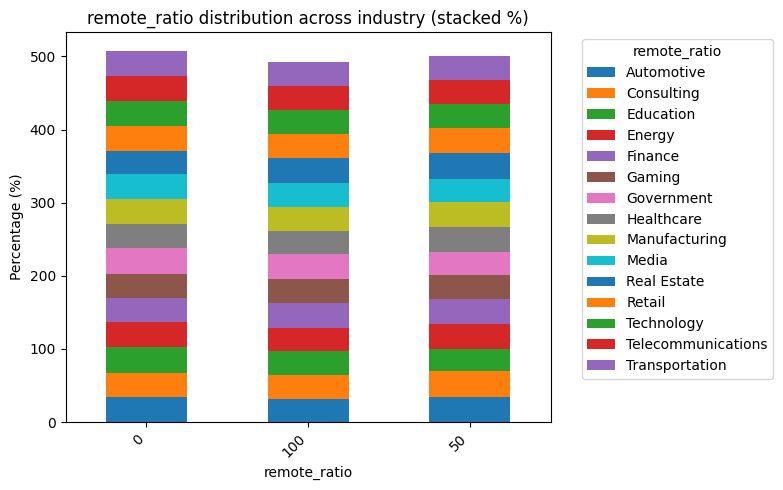

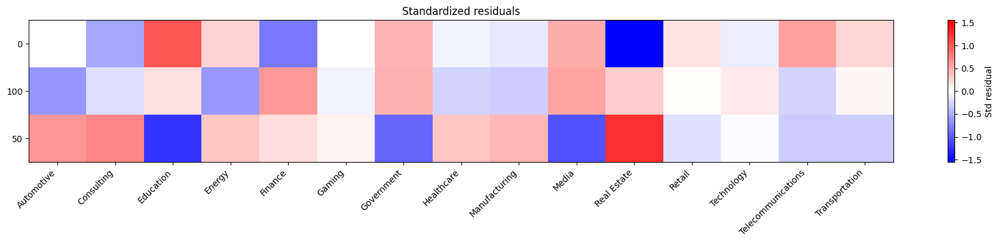


Analysis: remote_ratio vs company_name
------------------------------------------------------------
Contingency table (counts):
company_name  AI Innovations  Advanced Robotics  Algorithmic Solutions  \
remote_ratio                                                             
0                        340                328                    305   
100                      317                291                    285   
50                       307                306                    295   

company_name  Autonomous Tech  Cloud AI Solutions  Cognitive Computing  \
remote_ratio                                                             
0                         306                 327                  317   
100                       294                 329                  302   
50                        318                 295                  353   

company_name  DataVision Ltd  DeepTech Ventures  Digital Transformation LLC  \
remote_ratio                                      

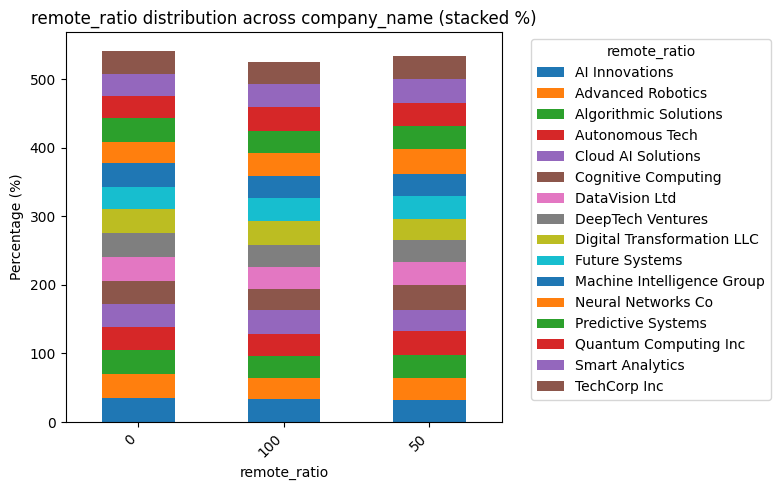

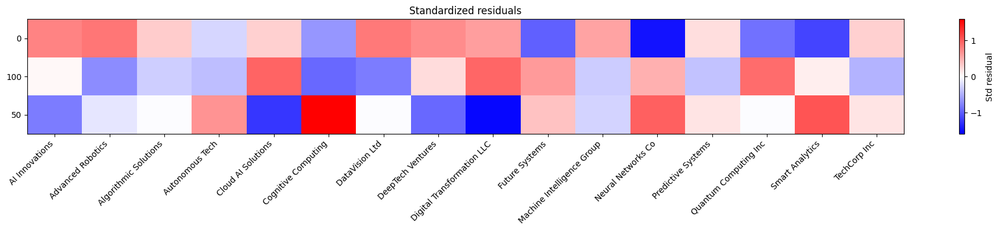


Analysis: education_required vs industry
------------------------------------------------------------
Contingency table (counts):
industry            Automotive  Consulting  Education  Energy  Finance  \
education_required                                                       
Associate                  257         248        234     240      271   
Bachelor                   258         264        252     245      257   
Master                     243         244        219     267      231   
PhD                        262         264        251     224      225   

industry            Gaming  Government  Healthcare  Manufacturing  Media  \
education_required                                                         
Associate              254         265         242            256    256   
Bachelor               243         245         259            269    254   
Master                 241         243         241            227    294   
PhD                    229         245      

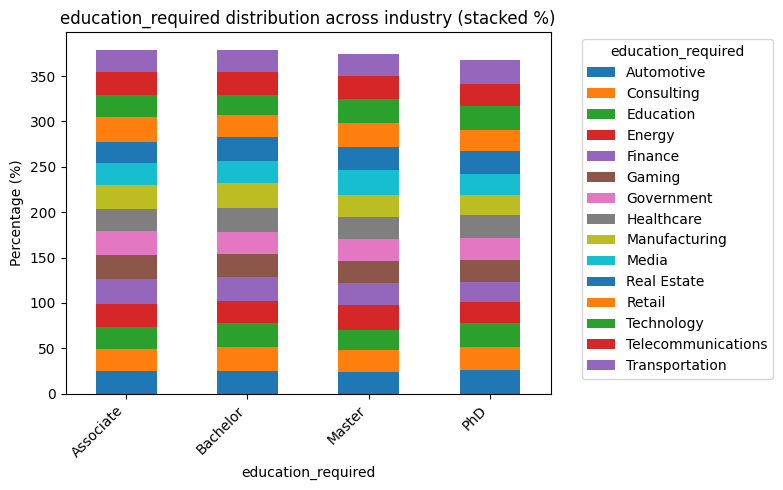

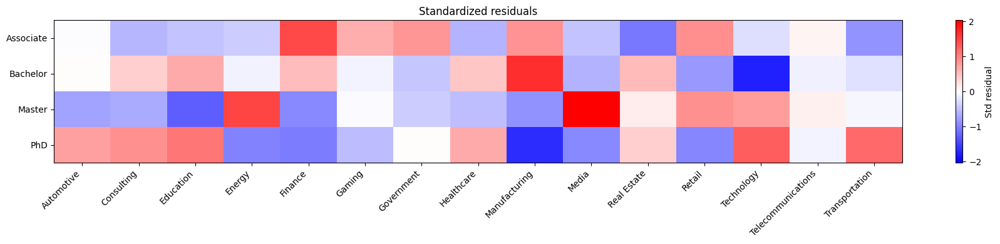


Analysis: education_required vs company_name
------------------------------------------------------------
Contingency table (counts):
company_name        AI Innovations  Advanced Robotics  Algorithmic Solutions  \
education_required                                                             
Associate                      242                247                    197   
Bachelor                       250                213                    226   
Master                         249                228                    238   
PhD                            223                237                    224   

company_name        Autonomous Tech  Cloud AI Solutions  Cognitive Computing  \
education_required                                                             
Associate                       243                 247                  267   
Bachelor                        230                 240                  230   
Master                          219                 250         

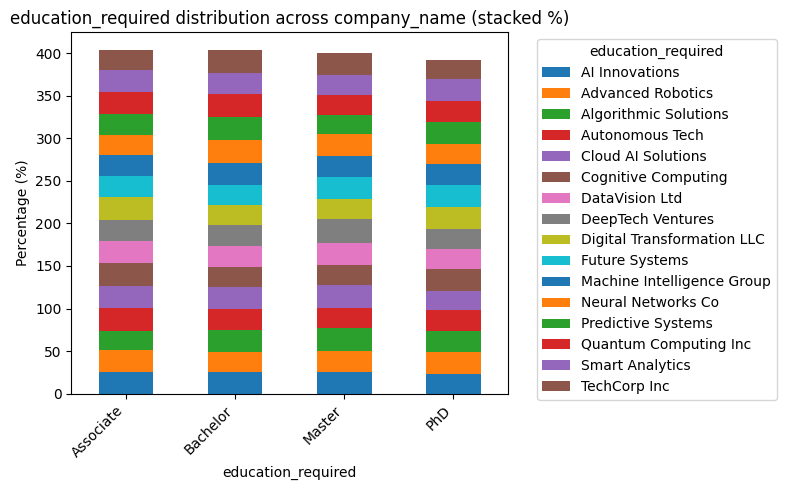

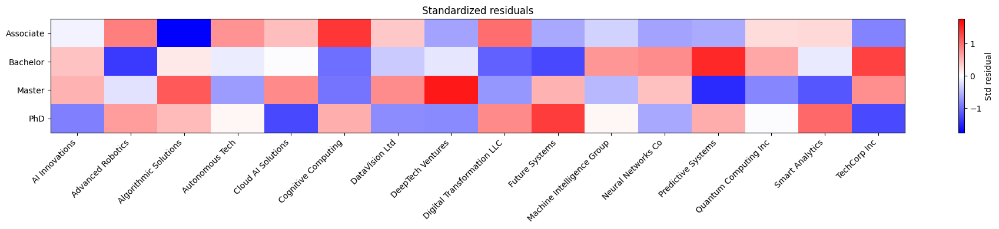


Analysis: industry vs company_name
------------------------------------------------------------
Contingency table (counts):
company_name        AI Innovations  Advanced Robotics  Algorithmic Solutions  \
industry                                                                       
Automotive                      58                 64                     55   
Consulting                      71                 59                     70   
Education                       60                 63                     53   
Energy                          58                 71                     57   
Finance                         61                 66                     56   
Gaming                          69                 60                     70   
Government                      68                 39                     64   
Healthcare                      56                 66                     51   
Manufacturing                   62                 67                     5

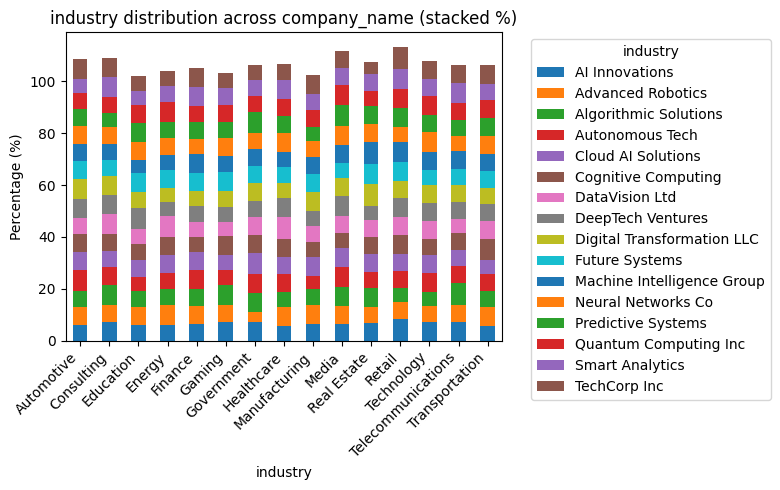

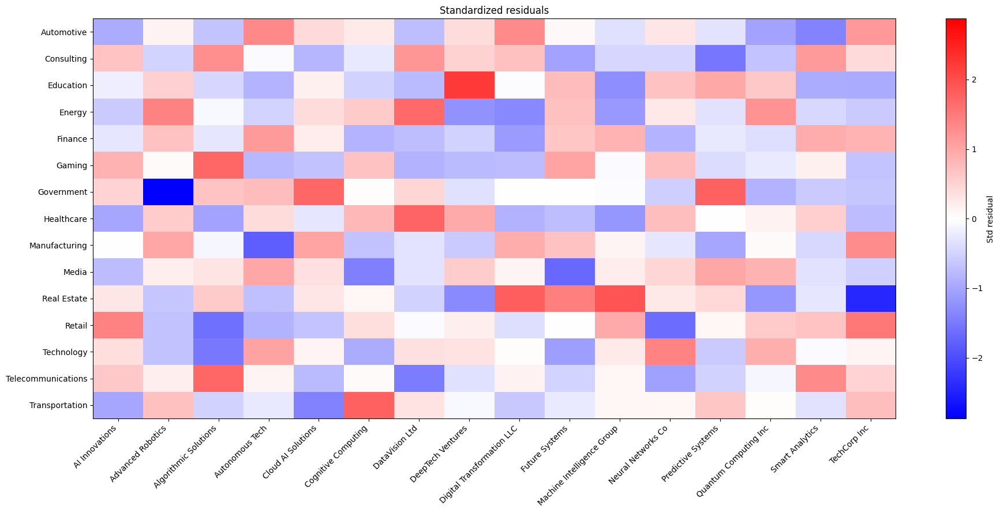

In [69]:
import itertools
from pandas.api.types import is_bool_dtype

# used llm to beautify and standardize output for each pair of variables


for c in df_categorical_vars.columns:
    if is_bool_dtype(df_categorical_vars[c]):
        df_categorical_vars[c] = df_categorical_vars[c].astype(int)
    df_categorical_vars[c] = df_categorical_vars[c].fillna("Missing").astype(str)


def chi2_analysis(var_a, var_b, df_sub, plot=True, alpha=0.05, show_tables=True,
                  top_k_per_col=2, similarity_threshold_pct=5.0):
    a = df_sub[var_a].astype(str)
    b = df_sub[var_b].astype(str)

    ct = pd.crosstab(a, b)
    if ct.size == 0:
        print(f"No data for pair {var_a} vs {var_b}")
        return None

    r, k = ct.shape
    n = int(ct.values.sum())

    # hypotheses
    h0 = f"H0: Variables '{var_a}' and '{var_b}' are independent (no association)."
    h1 = f"H1: Variables '{var_a}' and '{var_b}' are associated (there is an association)."

    print("\n" + "="*60)
    print(f"Analysis: {var_a} vs {var_b}")
    # print(h0); print(h1)
    print("-"*60)

    if show_tables:
        print("Contingency table (counts):")
        print(ct)

    # chi-square test
    use_yates = (r == 2 and k == 2)
    chi2, p, dof, expected = stats.chi2_contingency(ct, correction=use_yates)
    expected = np.array(expected, dtype=float)

    # check expected frequencies
    small_cells = (expected < 5).sum()
    prop_small = small_cells / expected.size if expected.size else 0.0

    # standardized residuals (avoid division by zero)
    with np.errstate(divide='ignore', invalid='ignore'):
        std_resid = (ct.values - expected) / np.sqrt(expected)
        std_resid[~np.isfinite(std_resid)] = np.nan

    # prepare table representations
    expected_df = pd.DataFrame(expected, index=ct.index, columns=ct.columns)
    std_resid_df = pd.DataFrame(std_resid, index=ct.index, columns=ct.columns)

    print(f"\nChi2 = {chi2:.6f}")
    print(f"Degrees of freedom = {dof}")
    print(f"p-value = {p:.6f} {'(Yates applied)' if use_yates else ''}")
    print(f"n = {n}, table shape = {r} x {k}")

    if prop_small > 0:
        print(f"WARNING: {small_cells} cells ({prop_small:.1%}) have expected freq < 5 — interpret χ² with caution.")

    if show_tables:
        print("\nExpected frequencies:")
        print(expected_df.round(2))
        print("\nStandardized residuals (obs - exp) / sqrt(exp):")
        print(std_resid_df.round(3))

    ct_pct = ct.div(ct.sum(axis=0), axis=1) * 100
    print("\nDistribution of", var_a, "within each", var_b, "(%) :")
    print(ct_pct.round(2))

    applicability_lines = []
    applicability_lines.append("Why chi-square is applicable / not applicable to this pair:")
    applicability_lines.append(f"- Data types: both variables have been converted to categorical (strings).")
    applicability_lines.append(f"- Sample size: n = {n}. With large n, χ² is sensitive to small effects.")
    applicability_lines.append(f"- Table size: {r} x {k} levels (rows x columns).")
    applicability_lines.append(f"- Expected-frequency rule: {small_cells} cells ({prop_small:.1%}) have expected < 5.")
    if prop_small > 0.2:
        applicability_lines.append("  → Since >20% of cells have small expected counts (<5), χ² results may be unreliable. "
                                  "Consider Fisher's exact test (for 2x2), collapsing rare categories, or a permutation test.")
    else:
        applicability_lines.append("  → The expected-frequency condition is generally satisfied; χ² is applicable.")
    if use_yates:
        applicability_lines.append(" - Yates' continuity correction was applied for 2x2 tables.")
    applicability_lines.append(f"- Formal test summary: χ² = {chi2:.4f}, df = {dof}, p = {p:.4e}.")
    if p < alpha:
        applicability_lines.append("  → p < α: statistically significant association (reject H0).")
    else:
        applicability_lines.append("  → p ≥ α: no statistically significant association found (fail to reject H0).")

    applicability = "\n".join(applicability_lines)

    tendencies_lines = []
    tendencies_lines.append("Tendencies in the frequency distribution (based on column-wise percentages):")
    max_cols_to_report = min(k, 8)
    for j, col in enumerate(ct.columns[:max_cols_to_report]):
        col_pct = ct_pct[col].sort_values(ascending=False)
        top_k = col_pct.head(top_k_per_col)
        bottom_k = col_pct.tail(top_k_per_col)
        tendencies_lines.append(f"\n- For {var_b} = '{col}':")
        for idx, val in top_k.items():
            tendencies_lines.append(f"    • {var_a} = '{idx}' — {val:.1f}% (one of the most frequent)")
        for idx, val in bottom_k.items():
            tendencies_lines.append(f"    • {var_a} = '{idx}' — {val:.1f}% (rare)")

    pct_by_a = ct_pct.fillna(0)
    if pct_by_a.size > 0:
        ranges = pct_by_a.max(axis=1) - pct_by_a.min(axis=1)
        max_diff = ranges.max()
        max_diff_cat = ranges.idxmax()
        tendencies_lines.append(f"\n- Largest difference in shares for a single level of {var_a} = '{max_diff_cat}': difference across columns ≈ {max_diff:.1f}%")
        if max_diff < similarity_threshold_pct:
            tendencies_lines.append(f"  → Overall, column distributions are similar (max diff < {similarity_threshold_pct}%).")
        else:
            tendencies_lines.append(f"  → There are noticeable differences between columns (max diff = {max_diff:.1f}%).")

    if p < alpha:
        interp = (f"Interpretation: p < {alpha} → reject H0. "
                  f"A statistically significant association was found between '{var_a}' and '{var_b}' "
                  f"(p = {p:.4e}).")
    else:
        interp = (f"Interpretation: p >= {alpha} → failed to reject H0. "
                  f"No statistically significant association between '{var_a}' and '{var_b}' at α = {alpha} "
                  f"(p = {p:.4e}).")


    tendencies = "\n".join(tendencies_lines)

    print("\n" + "-"*40)
    print("APPLICABILITY:")
    print(applicability)
    print("\nHYPOTHESES:")
    print(h0)
    print(h1)
    print("\nTENDENCIES:")
    print(tendencies)

    print("\nINTERPRETATION:")
    print(interp)

    if plot:
        fig, ax = plt.subplots(figsize=(8, 5))
        ct_pct.plot(kind='bar', stacked=True, ax=ax)
        ax.set_ylabel("Percentage (%)")
        ax.set_title(f"{var_a} distribution across {var_b} (stacked %)")
        ax.legend(title=var_a, bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()

        vmax = np.nanmax(np.abs(std_resid)) if std_resid.size else 1
        fig2, ax2 = plt.subplots(figsize=(max(6, k*1.2), max(4, r*0.6)))
        im = ax2.imshow(std_resid, cmap='bwr', aspect='auto', vmin=-vmax, vmax=vmax)
        ax2.set_xticks(np.arange(k))
        ax2.set_yticks(np.arange(r))
        ax2.set_xticklabels(ct.columns, rotation=45, ha='right')
        ax2.set_yticklabels(ct.index)
        ax2.set_title("Standardized residuals")
        cbar = fig2.colorbar(im, ax=ax2)
        cbar.set_label("Std residual")
        plt.tight_layout()
        plt.show()


results = {}
for var_a, var_b in itertools.combinations(categorical_vars, 2):
    results[(var_a, var_b)] = chi2_analysis(var_a, var_b, df_categorical_vars, plot=True)


----------

3. Calculate appropriate correlation coefficients between **any three pairs** of variables. Explain the selection of the correlation coefficient. Fill in the table below. Interpret the results. Create suitable graphs to visualize the analyzed relationships. 

| Variables | Appropriate correlation coefficient(justification of the choice) | Hypotheses | Strength of the relationship | Direction of the relationship | Statistical significance of the relationship! |
| --- | --- | --- | --- | --- | --- |
| salary_usd vs years_experience | Pearson (both continuous, linear relationship are expected) | H0: ρ=0 (no correlation), H1: ρ≠0 | Strong (r = 0.738) | Positive (more experience means higher salary) | Highly significant (ρ = 0.000000) |
| salary_usd vs benefits_score | Spearman (monotonic, not strictly linear; benefits are bounded 1–10) | H0: ρ=0, H1: ρ≠0 | None (r = –0.005) | No direction (practically zero) | Not significant (ρ = 0.554) |
| salary_usd vs remote_ratio | Spearman (remote_ratio has a natural order but not continuous) | H0: ρ=0, H1: ρ≠0 | Very weak (r = 0.017) | Slightly positive (more remote work leads to tiny salary increase) | Statistically significant (ρ = 0.042) but not practically meaningful |

In [70]:
from scipy.stats import pearsonr, spearmanr


# calculate correlation between salary_usd and years_experience
x1 = df["years_experience"]
y1 = df["salary_usd"]
pearson_corr, pearson_p = pearsonr(x1, y1)

# calculate correlation between salary_usd and benefits_score
x2 = df["benefits_score"]
y2 = df["salary_usd"]
spearman_corr, spearman_p = spearmanr(x2, y2)

# calculate correlation between salary_usd and remote_ratio
x3 = df["remote_ratio"]
y3 = df["salary_usd"]
spearman2_corr, spearman2_p = spearmanr(x3, y3)

# print results of correlation analysis
results = pd.DataFrame({
    "Variables": [
        "salary_usd vs years_experience",
        "salary_usd vs benefits_score",
        "salary_usd vs remote_ratio"
    ],
    "Correlation Coefficient": [
        round(pearson_corr, 3),
        round(spearman_corr, 3),
        round(spearman2_corr, 3)
    ],
    "p-value": [
        pearson_p,
        spearman_p,
        spearman2_p
    ]
})

print(results)


                        Variables  Correlation Coefficient   p-value
0  salary_usd vs years_experience                    0.738  0.000000
1    salary_usd vs benefits_score                   -0.005  0.553688
2      salary_usd vs remote_ratio                    0.017  0.042127


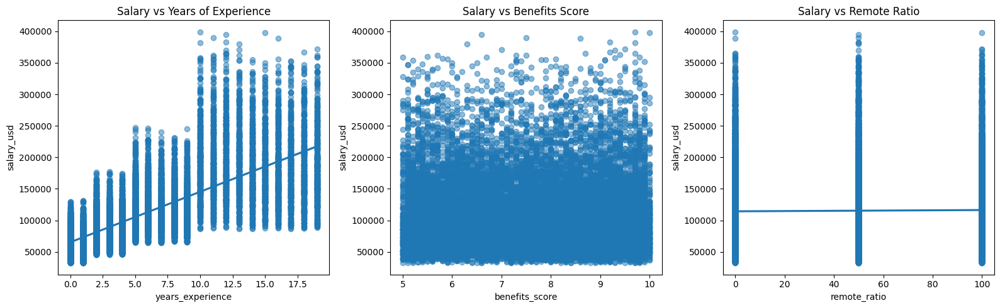

In [71]:
"""
visualization of results
"""

plt.figure(figsize=(16,5))

# 1. Salary vs Experience
plt.subplot(1,3,1)
sns.regplot(x=x1, y=y1, scatter_kws={'alpha':0.5})
plt.title("Salary vs Years of Experience")

# 2. Salary vs Benefits Score
plt.subplot(1,3,2)
sns.regplot(x=x2, y=y2, scatter_kws={'alpha':0.5}, lowess=True)
plt.title("Salary vs Benefits Score")

# 3. Salary vs Remote Ratio
plt.subplot(1,3,3)
sns.regplot(x=x3, y=y3, scatter_kws={'alpha':0.5})
plt.title("Salary vs Remote Ratio")

plt.tight_layout()
plt.show()

-----------

4. Calculate a paired correlation coefficient between any variables. Then calculate the partial correlation coefficient between the same pair of variables controlling for any other third variable. Interpret the results of analysis. Create suitable graphs to visualize the analyzed relationships.

In [72]:
# chosen variables are salary_usd and years_experience

# calculate paired correlation between salary_usd and years_experience using pearsonr
pearson_corr, p_value = pearsonr(df['salary_usd'], df['years_experience'])

print(f"Pearson correlation between salary and years of experience: {pearson_corr:.3f}, p-value: {p_value:.3e}")

Pearson correlation between salary and years of experience: 0.738, p-value: 0.000e+00


In [73]:
# Convert categorical variables to numeric to check correlation between numeric variables

# Experience level
exp_mapping = {'EN': 1, 'MI': 2, 'SE': 3, 'EX': 4}
df['experience_level_num'] = df['experience_level'].map(exp_mapping)

# Company size
size_mapping = {'S': 1, 'M': 2, 'L': 3}
df['company_size_num'] = df['company_size'].map(size_mapping)

# Education required
edu_mapping = {'High School': 1, 'Bachelor': 2, 'Master': 3, 'PhD': 4}
df['education_required_num'] = df['education_required'].map(edu_mapping)


                        salary_usd  years_experience  company_size_num  \
salary_usd                1.000000          0.740581          0.196077   
years_experience          0.740581          1.000000          0.001798   
company_size_num          0.196077          0.001798          1.000000   
experience_level_num      0.758504          0.925405          0.006105   
education_required_num   -0.014264         -0.018139          0.002567   
benefits_score            0.006784         -0.000910          0.010899   
job_description_length   -0.020742         -0.014435          0.014612   
remote_ratio              0.019531          0.021616          0.011947   

                        experience_level_num  education_required_num  \
salary_usd                          0.758504               -0.014264   
years_experience                    0.925405               -0.018139   
company_size_num                    0.006105                0.002567   
experience_level_num                1.000000 

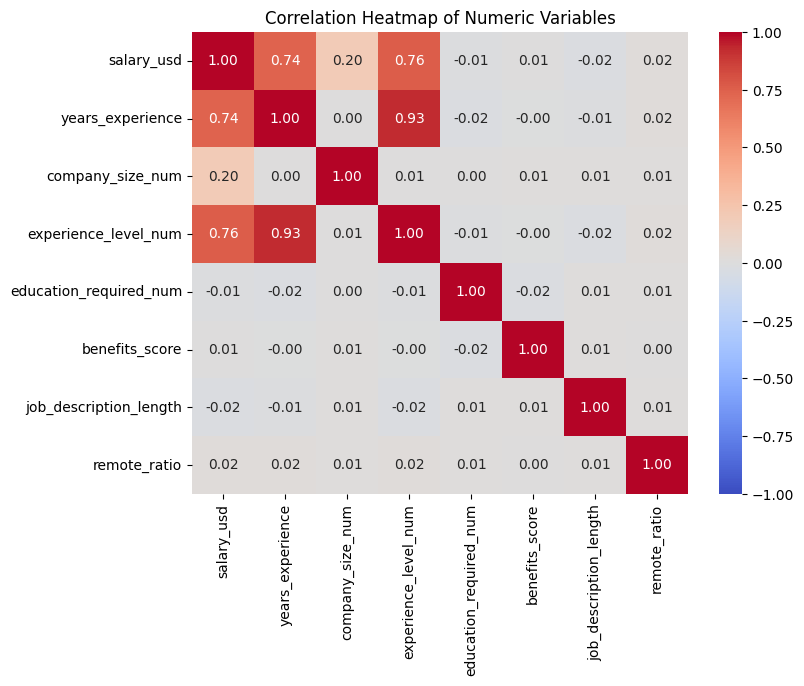

In [74]:
# Select numeric variables
numeric_cols = [
    'salary_usd', 
    'years_experience', 
    'company_size_num',
    'experience_level_num',
    'education_required_num',
    'benefits_score', 
    'job_description_length',
    'remote_ratio'
]
df_numeric = df[numeric_cols].dropna()

# Calculate correlation matrix
corr_matrix = df_numeric.corr(method='pearson')
print(corr_matrix)

# Plot correlation heatmap
plt.figure(figsize=(8,6))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Correlation Heatmap of Numeric Variables")
plt.show()

# High correlation between salary_usd and years_experience, and salary_usd and experience_level_num
# Medium correlation between salary_usd and company_size
# Meanwhile, there is no strong correlation between other variables

In [75]:
import pingouin as pg # for partial correlation
# paired correlation was 0.738

# select needed columns
df_partial = df[['salary_usd', 'years_experience', 'experience_level_num', 'company_size_num']].dropna()

# Partial correlation controlling for only company_size_num
partial_corr = pg.partial_corr(data=df_partial,
                               x='salary_usd',
                               y='years_experience',
                               covar=['company_size_num'],
                               method='pearson')

print("Partial correlation between salary and years_experience controlling for experience_level and company_size:")
print(partial_corr)

# Correlation value increased from 0.738 to 0.753 because salary_usd and years_experience are positively correlated and salary_usd and company_size_num are negatively correlated.

Partial correlation between salary and years_experience controlling for experience_level and company_size:
             n         r         CI95%  p-val
pearson  15000  0.752911  [0.75, 0.76]    0.0


In [76]:
# Partial correlation controlling for only years_experience
partial_corr = pg.partial_corr(data=df_partial,
                               x='salary_usd',
                               y='years_experience' ,
                               covar=['experience_level_num'],
                               method='pearson')

print("Partial correlation between salary and years_experience controlling for experience_level and company_size:")
print(partial_corr)

# Correlation value decreased from 0.753 to 0.149 because experience_level_num and years_experience are strongly correlated (p = 0.93).

Partial correlation between salary and years_experience controlling for experience_level and company_size:
             n         r         CI95%         p-val
pearson  15000  0.148618  [0.13, 0.16]  8.053807e-75


In [77]:
# Partial correlation controlling for both years_experience and company_size_num
partial_corr = pg.partial_corr(data=df_partial,
                               x='salary_usd',
                               y='years_experience',
                               covar=['experience_level_num', 'company_size_num'],
                               method='pearson')

print("Partial correlation between salary and years_experience controlling for experience_level and company_size:")
print(partial_corr)

# With both covars removed, the partial correlation became 0.159
# Thus, much of the raw correlation between salary and years of experience is actually explained by experience level and company size.
# In other words, higher salaries are not just about more years of experience — they are also about being at a higher level (grade) and/or a bigger company.

Partial correlation between salary and years_experience controlling for experience_level and company_size:
             n         r         CI95%         p-val
pearson  15000  0.158844  [0.14, 0.17]  2.484838e-85


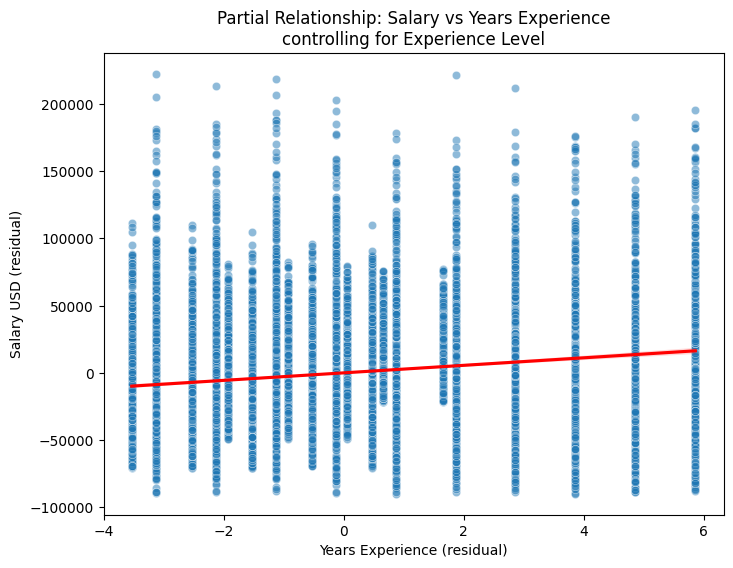

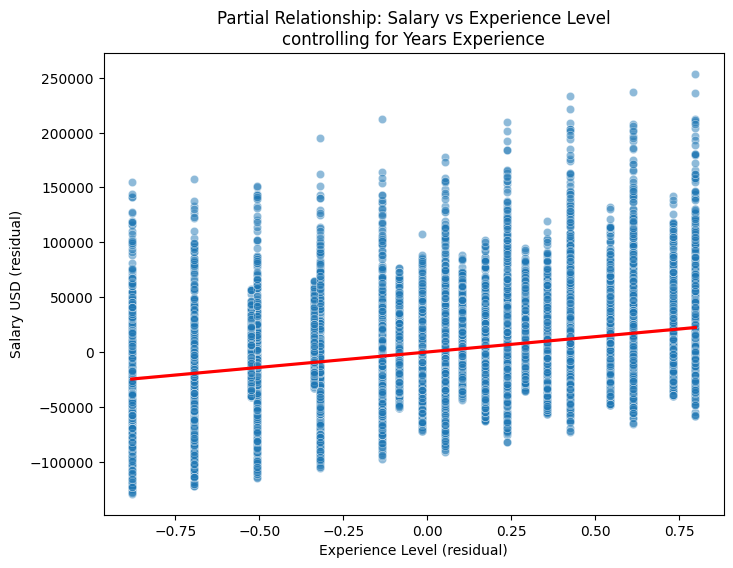

In [78]:
import statsmodels.api as sm

# 1. Partial correlation: salary vs years_experience controlling for experience_level
# Regress salary on experience_level
X = sm.add_constant(df['experience_level_num'])
y = df['salary_usd']
model = sm.OLS(y, X).fit()
residual_salary = model.resid

# Regress years_experience on experience_level
y_exp = df['years_experience']
model_exp = sm.OLS(y_exp, X).fit()
residual_exp = model_exp.resid

# Scatterplot of residuals
plt.figure(figsize=(8,6))
sns.scatterplot(x=residual_exp, y=residual_salary, alpha=0.5)
sns.regplot(x=residual_exp, y=residual_salary, scatter=False, color='red')
plt.xlabel("Years Experience (residual)")
plt.ylabel("Salary USD (residual)")
plt.title("Partial Relationship: Salary vs Years Experience\ncontrolling for Experience Level")
plt.show()


# 2. Partial correlation: salary vs experience_level controlling for years_experience
# Regress salary on years_experience
X = sm.add_constant(df['years_experience'])
model = sm.OLS(y, X).fit()
residual_salary = model.resid

# Regress experience_level on years_experience
X = sm.add_constant(df['years_experience'])
y_level = df['experience_level_num']
model_level = sm.OLS(y_level, X).fit()
residual_level = model_level.resid

# Scatterplot of residuals
plt.figure(figsize=(8,6))
sns.scatterplot(x=residual_level, y=residual_salary, alpha=0.5)
sns.regplot(x=residual_level, y=residual_salary, scatter=False, color='red')
plt.xlabel("Experience Level (residual)")
plt.ylabel("Salary USD (residual)")
plt.title("Partial Relationship: Salary vs Experience Level\ncontrolling for Years Experience")
plt.show()


Comments on the task and principles of its assessment:

- All points of the task must be accompanied by _executed_ code fragments.
- All results of the code execution (statistics, graphs, tables) should be commented, conclusions in the written form should be made based on them.
- If you have completed this task, you will receive 8 points (excellent grade). To get a higher grade (9 or 10), you need to go beyond the proposed task. For example, use additional methods to investigate relationships between variables.
- This task consists of four parts. The first weighs 20%, the second - 20%, the third - 20%, the fourth - 20%.
- The task can be completed individually or in a group of 2 students, the assessment criteria will be the same.
- If the task is completed by 2 students, then only one of the students should upload the work to SmartLMS.
- The name of the file uploaded to SmartLMS should include the last name(s) of the author(s) of the work.
- If you use AI in the work, you must indicate where and how exactly it was used.

### Please upload the Jupyter Notebook with comments and answers in SmartLMS. The deadline is 17 September 23:55. 